## This notebook implements the GuidedNet method on the Pavia Center Hyperspectral Image

Imports

In [1]:
import numpy as np
import scipy.io as sio
import time
import random
import cv2
import math
import pynvml

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

import io as iot
import sys
from spectral import *
from tqdm import trange
from argparse import Namespace
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from scipy.special import gamma, kv, erf
from config import *
from collections import OrderedDict
from tqdm import tqdm
import psutil
import tensorflow as tf
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2

In [2]:
def set_random_seed(seed=42):
    """
    Sets the random seed for reproducibility in TensorFlow, NumPy, and Python.
    Also sets TF deterministic ops.
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

    # Optional: Force deterministic operations
    try:
        tf.config.experimental.enable_op_determinism()
    except AttributeError:
        # Older TF version fallback
        os.environ['TF_DETERMINISTIC_OPS'] = '1'
        
set_random_seed(42)

Helper Functions

In [3]:
# Defining each PSF

kernel_size = 7
sigma = 3.40

def gaussian_psf(sigma, psf_size):
    """Generate a Gaussian PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    psf = np.exp(-(X**2 + Y**2) / (2 * sigma**2))
    psf = psf / psf.sum()
    return psf
gaus_psf = gaussian_psf(sigma, kernel_size)

def kolmogorov_psf(sigma, psf_size):
    """Generate a Kolmogorov PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = np.exp(-(r / sigma)**(5/3))
    psf = psf / psf.sum()
    return psf
kol_psf = kolmogorov_psf(sigma, kernel_size)

def airy_psf(sigma, psf_size):
    """Generate an Airy PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    z = (2.33811 * r) / sigma
    psf = (2 * kv(1, z) / z)**2
    psf[r == 0] = 1
    psf = psf / psf.sum()
    return psf
air_psf = airy_psf(sigma, kernel_size)

def moffat_psf(sigma, psf_size, beta=3.5):
    """Generate a Moffat PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = (1 + (r / sigma)**2)**(-beta)
    psf = psf / psf.sum()
    return psf
mof_psf = moffat_psf(sigma, kernel_size)

def sinc_psf(sigma, psf_size):
    """Generate a Sinc PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = np.sinc(r / sigma)
    psf = psf / psf.sum()
    return psf
sinc_psf = sinc_psf(sigma, kernel_size)

def lorentzian_squared_psf(sigma, psf_size):
    """Generate a Lorentzian Squared PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = 1 / (1 + (r / sigma)**4)
    psf = psf / psf.sum()
    return psf
lor_sq_psf = lorentzian_squared_psf(sigma, kernel_size)

def hermite_psf(sigma, psf_size, n=1):
    """Generate a Hermite PSF."""
    from numpy.polynomial.hermite import hermval
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = np.exp(-r**2 / (2 * sigma**2)) * hermval(r / sigma, [0]*n + [1])
    psf = psf / psf.sum()
    return psf
her_psf = hermite_psf(sigma, kernel_size)

def parabolic_psf(sigma, psf_size):
    """Generate a Parabolic PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = np.maximum(0, 1 - (r / sigma)**2)
    psf = psf / psf.sum()
    return psf
par_psf = parabolic_psf(sigma, kernel_size)

def gabor_psf(sigma, psf_size, theta=0, lambd=1, gamma=0.5, psi=0):
    """Generate a Gabor PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    x_theta = X * np.cos(theta) + Y * np.sin(theta)
    y_theta = -X * np.sin(theta) + Y * np.cos(theta)
    psf = np.exp(-0.5 * (x_theta**2 + gamma**2 * y_theta**2) / sigma**2) * np.cos(2 * np.pi * x_theta / lambd + psi)
    psf = psf / psf.sum()
    return psf
gab_psf = gabor_psf(sigma, kernel_size)

def delta_function_psf(sigma, psf_size):
    """Generate a Delta Function PSF."""
    psf = np.zeros((2*psf_size+1, 2*psf_size+1))
    psf[psf_size, psf_size] = 1
    return psf
delta_psf = delta_function_psf(sigma, kernel_size)

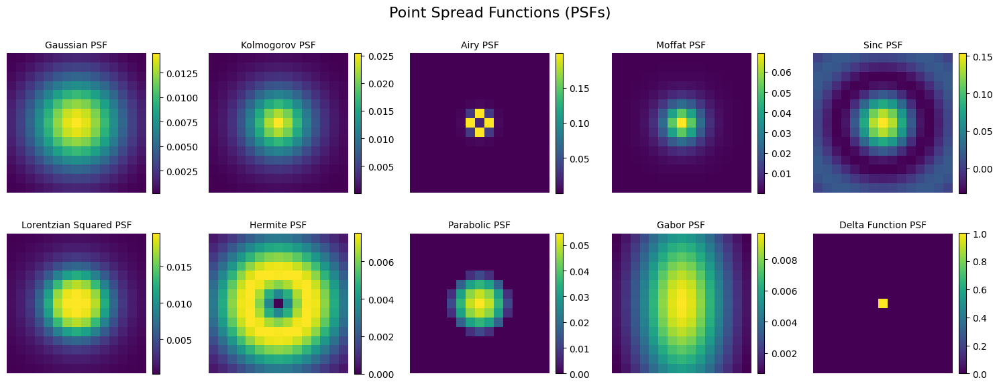

In [4]:
# Visualizing all the PSFs that will be used

psfs = [
    (gaus_psf, "Gaussian PSF"),
    (kol_psf, "Kolmogorov PSF"),
    (air_psf, "Airy PSF"),
    (mof_psf, "Moffat PSF"),
    (sinc_psf, "Sinc PSF"),
    (lor_sq_psf, "Lorentzian Squared PSF"),
    (her_psf, "Hermite PSF"),
    (par_psf, "Parabolic PSF"),
    (gab_psf, "Gabor PSF"),
    (delta_psf, "Delta Function PSF")
]

# Create subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # 5 columns, 2 rows
fig.suptitle("Point Spread Functions (PSFs)", fontsize=16)

# Plot each PSF
for i, (psf, label) in enumerate(psfs):
    ax = axes[i // 5, i % 5]  # Determine subplot position
    im = ax.imshow(psf, cmap='viridis')
    ax.set_title(label, fontsize=10)
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

In [5]:
def numpy_to_tf(image):
    
    """
    Converts a numpy array into a tensorflow tensor.
    
    Parameters:
    -----------
    image : np.ndarray
        Shape (height, width, channels)
        
     Returns:
    --------
    image_tf: tf.constant
        Shape (1, height, width, channels
    """
    
    image = np.expand_dims(image, axis=0)
    image_tf = tf.constant(image, dtype=tf.float32)
    
    return image_tf

def tf_to_numpy(image_tf):
    
    """
    Converts a tensorflow tensor into a numpy array.
    
    Parameters:
    -----------
    image_tf : tf.constant
        Shape (1, height, width, channels)
        
     Returns:
    --------
    image: np.ndarray
        Shape (height, width, channels
    """
    
    image = image_tf.numpy()
    image = np.squeeze(image)
    
    return image

In [6]:
# Function to apply PSF to an image
def apply_psf(image, psf):
    
    """
    Convolve each channel of 'image' with 'psf' using 'same' padding.

    Parameters:
    -----------
    image : np.ndarray
        Shape (height, width, channels).
    psf   : np.ndarray
        Shape (kernel_height, kernel_width).
        
    Returns:
    --------
    blurred_image : np.ndarray
        Same shape as input image (height, width, channels).
    """
    
    # Prepare an output array of the same shape as 'image'
    blurred_image = np.zeros_like(image, dtype=np.float32)

    # Convolve each channel separately
    channels = image.shape[2]
    for c in range(channels):
        # convolve2d with mode='same' replicates TensorFlow's 'SAME' padding
        blurred_image[:, :, c] = convolve2d(image[:, :, c], psf, mode='same')
        
    return blurred_image
    
# Function to downsample an image
def downsample_image(image, factor):
    # Ensure the input image is a NumPy array
    if not isinstance(image, np.ndarray):
        image = np.array(image)
    
    # Get the dimensions of the image
    height, width, channels = image.shape
    
    # Initialize a list to hold the downsampled channels
    downsampled_channels = []
    
    # Downsample each channel individually
    for c in range(channels):
        channel = image[:, :, c]
        downsampled_channel = cv2.resize(channel, (width // factor, height // factor), interpolation=cv2.INTER_AREA)
        downsampled_channels.append(downsampled_channel)
    
    # Stack the downsampled channels back together
    downsampled_image = np.stack(downsampled_channels, axis=-1)
    
    return downsampled_image
    
# Function to add noise to an image
def add_awgn_noise(hsi_image, SNR_dB):
    
    """
    Add AWGN (Additive White Gaussian Noise) to the input hsi_image,
    given a desired SNR in dB. Uses NumPy only.

    Parameters
    ----------
    hsi_image : np.ndarray
        Input image of shape (rows, cols, channels).
    SNR_dB : float
        Desired SNR in decibels.

    Returns
    -------
    noisy_hsi_image : np.ndarray
        Noisy image of the same shape as hsi_image.
    """

     # Ensure float32
    hsi_image = hsi_image.astype(np.float32)

    rows, cols, channels = hsi_image.shape

    # Compute the signal power for each channel
    # shape: (channels,)
    signal_power = np.mean(hsi_image ** 2, axis=(0, 1))

    # Convert SNR from dB to linear scale
    SNR_linear = 10 ** (SNR_dB / 10.0)

    # Compute noise power and noise standard deviation per channel
    noise_power = signal_power / SNR_linear  # shape: (channels,)
    noise_std = np.sqrt(noise_power)         # shape: (channels,)

    # Reshape for broadcasting across (rows, cols)
    noise_std = noise_std.reshape((1, 1, channels))

    # Generate white Gaussian noise
    noise = np.random.normal(
        loc=0.0, 
        scale=1.0, 
        size=(rows, cols, channels)
    ).astype(np.float32)

    # Scale noise by the computed standard deviation
    noise *= noise_std

    # Add noise to the original image
    noisy_hsi_image = hsi_image + noise

    return noisy_hsi_image
    
# Function to normalize an image between 0 and 1 safely
def normalize(image):
    """
    Normalize an image to the range [0, 1] while clipping outliers.
    
    Parameters:
    -----------
    image : np.ndarray
        Input image with arbitrary range values.
    
    Returns:
    --------
    normalized_image : np.ndarray
        Normalized image in range [0, 1].
    """
    min_val, max_val = np.percentile(image, [1, 99])
    return (np.clip(image, min_val, max_val) - min_val) / (max_val - min_val)

# Function to obtain the Spectral Response Function for spectral degradation
def get_srf_bands(num_bands: int) -> np.ndarray:
    """
    Return a (num_bands, 3) array of [center_nm, low_edge_nm, high_edge_nm]
    matching the specified 'num_bands' from {1,3,4,8,16}.
    
    1-band  => IKONOS Panchromatic
    3-bands => IKONOS RGB
    4-bands => IKONOS B, G, R, NIR
    8-bands => WorldView-2 
    16-bands => WorldView-3

    Raises ValueError if num_bands is not in [1,3,4,8,16].
    """

    if num_bands == 1:
        # IKONOS panchromatic
        band_specs = np.array([
            [729.0, 409.0, 1048.0]  # center, lower, upper
        ], dtype=np.float32)
    
    elif num_bands == 3:
        # IKONOS RGB
        band_specs = np.array([
            [480.0, 421.0, 539.0],  # Blue
            [552.0, 480.0, 624.0],  # Green
            [666.0, 602.0, 729.0],  # Red
        ], dtype=np.float32)
    
    elif num_bands == 4:
        # IKONOS B, G, R, NIR
        band_specs = np.array([
            [480.0, 421.0, 539.0],  # Blue
            [552.0, 480.0, 624.0],  # Green
            [666.0, 602.0, 729.0],  # Red
            [803.0, 713.0, 893.0],  # NIR
        ], dtype=np.float32)

    elif num_bands == 8:
        # WorldView-2
        band_specs = np.array([
            [427.0, 396.0, 458.0],  # Coastal Blue
            [478.0, 442.0, 515.0],  # Blue
            [546.0, 506.0, 586.0],  # Green
            [608.0, 584.0, 632.0],  # Yellow
            [659.0, 624.0, 694.0],  # Red
            [724.0, 699.0, 749.0],  # Red Edge
            [833.0, 765.0, 901.0],  # NIR1
            [949.0, 856.0, 1043.0], # NIR2
        ], dtype=np.float32)
    
    elif num_bands == 16:
        # WorldView-3
        band_specs = np.array([
            [426.0, 397.0, 454.0],    # Coastal Blue
            [481.0, 445.0, 517.0],    # Blue
            [547.0, 507.0, 586.0],    # Green
            [605.0, 580.0, 629.0],    # Yellow
            [661.0, 626.0, 696.0],    # Red
            [724.0, 698.0, 749.0],    # Red Edge
            [832.0, 765.0, 899.0],    # NIR1
            [948.0, 857.0, 1039.0],   # NIR2
            [1210.0, 1184.0, 1235.0], # SWIR1
            [1572.0, 1546.0, 1598.0], # SWIR2
            [1661.0, 1636.0, 1686.0], # SWIR3
            [1730.0, 1702.0, 1759.0], # SWIR4
            [2164.0, 2137.0, 2191.0], # SWIR5
            [2203.0, 2174.0, 2232.0], # SWIR6
            [2260.0, 2228.0, 2292.0], # SWIR7
            [2329.0, 2285.0, 2373.0], # SWIR8
        ], dtype=np.float32)
    
    else:
        raise ValueError(f"Unsupported num_bands={num_bands}. Must be 1,3,4,8, or 16.")

    return band_specs
    
# Function to apply SRF to an image
def apply_srf(
    hyper_image: np.ndarray,
    band_specs: np.ndarray,
    fwhm_factor: float = 4.2
):
    """
    Apply a Gaussian-based SRF (based on band_specs) to the given HR hyperspectral image.
    
    Unlike the previous version, this function infers the number of HSI bands (L) 
    from hyper_image.shape, and automatically constructs a linearly-spaced 
    wavelength array from the minimum lower_edge to the maximum upper_edge 
    in band_specs.

    Parameters
    ----------
    hyper_image : np.ndarray
        (rows, cols, L) float32 (or will be converted). The high-resolution HSI.
    band_specs : np.ndarray
        (num_bands, 3) array, each row = [center_nm, low_edge_nm, upper_edge_nm].
        Examples: 
            - 1-band IKONOS Panchromatic 
            - 3-band IKONOS RGB 
            - 4-band IKONOS (B,G,R,NIR) 
            - 8-band WorldView-2 
            - 16-band WorldView-3
        etc.
    fwhm_factor : float
        Factor to convert from (upper_edge - lower_edge) to approximate standard deviation.
        By default 4.2, typical ratio (FWHM / (2.355...) or so for a Gaussian).

    Returns
    -------
    ms_image : np.ndarray
        (rows, cols, num_bands). The resulting multi/pan/RGB image.
    srf : np.ndarray
        (num_bands, L). The spectral response function for each output band
        across the L inferred HSI wavelength positions.
    auto_wavelengths : np.ndarray
        (L,) The automatically-generated wavelength array spanning 
        [min_lower_edge, max_upper_edge].
    """

    # 1) Ensure float32
    hyper_image = hyper_image.astype(np.float32)
    rows, cols, L = hyper_image.shape

    # 2) Determine the min/max edges from band_specs
    #    We will assume the entire HSI covers this range uniformly.
    #    E.g. for IKONOS Panchromatic: [409, 1048], etc.
    min_lower_edge = band_specs[:, 1].min()
    max_upper_edge = band_specs[:, 2].max()

    # 3) Construct a linearly-spaced wavelength array of length L
    #    from min_lower_edge to max_upper_edge, inclusive
    auto_wavelengths = np.linspace(min_lower_edge, max_upper_edge, L).astype(np.float32)
    # Shape: (L,)  We'll reshape to (1, L) for broadcasting
    wave_2d = auto_wavelengths[None, :]  # shape => (1, L)

    # 4) Prepare the SRF array
    num_bands = band_specs.shape[0]
    srf = np.zeros((num_bands, L), dtype=np.float32)

    for i in range(num_bands):
        center_nm = band_specs[i, 0]
        low_nm    = band_specs[i, 1]
        high_nm   = band_specs[i, 2]

        # approximate standard deviation from (high - low) / fwhm_factor
        std_nm = (high_nm - low_nm) / fwhm_factor

        # Gaussian SRF across all L wavelengths
        # shape => (1, L); after the operation => (L,) effectively
        srf_i = np.exp(-0.5 * ((wave_2d - center_nm) / std_nm) ** 2)

        # Normalize so the sum of srf_i is 1 across the L channels
        sum_i = srf_i.sum()
        if sum_i > 1e-8:
            srf_i /= sum_i

        srf[i, :] = srf_i

    # 5) Now srf has shape (num_bands, L). We want to apply it to hyper_image:
    #    hyper_image: (rows, cols, L)
    #    srf^T: (L, num_bands)
    # => tensordot => (rows, cols, num_bands)
    srf_t = srf.T  # shape => (L, num_bands)
    ms_image = np.tensordot(hyper_image, srf_t, axes=([2], [0]))  # => (rows, cols, num_bands)

    # 6) Convert to float32
    ms_image = ms_image.astype(np.float32)

    return ms_image, srf, auto_wavelengths

Functions to visualize the inputs

In [7]:
# Function to visualize an HSI
def visualize_hsi(img1, img2, bands, title1, title2):
    """
    Visualize two hyperspectral images side by side using RGB representations.

    Parameters:
    -----------
    img1 : np.ndarray
        First hyperspectral image.
    img2 : np.ndarray
        Second hyperspectral image.
    bands : tuple
        Band indices to use for RGB representation (applied to both images).
    title1 : str
        Title for the first image.
    title2 : str
        Title for the second image.
    """
    rgb1 = get_rgb(img1, bands)
    rgb2 = get_rgb(img2, bands)

    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    
    axs[0].imshow(rgb1)
    axs[0].set_title(title1)
    axs[0].axis('on')

    axs[1].imshow(rgb2)
    axs[1].set_title(title2)
    axs[1].axis('on')

    plt.tight_layout()
    plt.show()

# Function to visualize an MSI/RGB/Panchromatic image along with the SRF
def plot_multispectral_with_srf(ms_image1, ms_image2, bands, title1, title2, srf, wavelengths, ikonos_bands):
    """
    Visualize a multispectral (or RGB/panchromatic) image alongside its Spectral Response Function (SRF).
    
    Parameters
    ----------
    ms_image1 : np.ndarray
        First multispectral image, shape: (H, W, num_bands).
    ms_image2 : np.ndarray
        Second multispectral image, shape: (H2, W2, num_bands).
    bands : tuple
        Band indices to use for RGB visualization (must be valid for both images).
    title1 : str
        Title for the first image.
    title2 : str
        Title for the second image.
    srf : np.ndarray
        Spectral Response Function, shape: (num_bands, L).
    wavelengths : np.ndarray
        Wavelengths corresponding to the L hyperspectral bands.
    ikonos_bands : np.ndarray
        Array of shape (num_bands, 3) with [center_nm, low_edge_nm, high_edge_nm] per band.
    
    Notes
    -----
    - This function assumes num_bands is one of {1,3,4,8,16}.
    - If num_bands=1, we skip get_rgb and just display a grayscale single-band image.
    - If num_bands=3,4,8,16, we attempt to display an RGB image using 'bands' for the channel ordering.
    - The SRF curve colors and labels are chosen via if/elif blocks, 
      matching each possible number of bands.
    """
    num_bands = ms_image1.shape[2]
    assert ms_image2.shape[2] == num_bands, "Both MSI images must have the same number of bands"

    # Pick labels and colors based on number of bands
    if num_bands == 1:
        band_labels = ["Panchromatic"]
        band_colors = ["k"]
    elif num_bands == 3:
        band_labels = ["Blue", "Green", "Red"]
        band_colors = ["b", "g", "r"]
    elif num_bands == 4:
        band_labels = ["Blue", "Green", "Red", "NIR"]
        band_colors = ["b", "g", "r", "k"]
    elif num_bands == 8:
        band_labels = ["Coastal", "Blue", "Green", "Yellow", 
                       "Red", "Red Edge", "NIR1", "NIR2"]
        band_colors = ["b", "g", "r", "c", "m", "y", "k", "orange"]
    elif num_bands == 16:
        band_labels = [
            "Coastal Blue", "Blue", "Green", "Yellow", 
            "Red", "Red Edge", "NIR1", "NIR2",
            "SWIR1", "SWIR2", "SWIR3", "SWIR4",
            "SWIR5", "SWIR6", "SWIR7", "SWIR8"
        ]
        band_colors = [
            "b", "g", "r", "c", "m", "y", "k", "orange", 
            "purple", "brown", "pink", "gray", 
            "olive", "navy", "teal", "maroon"
        ]
    else:
        raise ValueError("Function only supports images with 1, 3, 4, 8, or 16 bands.")

    # Create figure with 3 subplots (2 for images, 1 for SRF)
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    # Plot first image
    if num_bands == 1:
        axs[0].imshow(ms_image1[:, :, 0], cmap='gray')
        axs[0].set_title(title1 + " (Panchromatic)")
    else:
        rgb1 = get_rgb(ms_image1, bands)
        axs[0].imshow(rgb1)
        axs[0].set_title(title1)
    axs[0].axis('off')

    # Plot second image
    if num_bands == 1:
        axs[1].imshow(ms_image2[:, :, 0], cmap='gray')
        axs[1].set_title(title2 + " (Panchromatic)")
    else:
        rgb2 = get_rgb(ms_image2, bands)
        axs[1].imshow(rgb2)
        axs[1].set_title(title2)
    axs[1].axis('off')

    # Plot SRF
    for i in range(num_bands):
        center_nm = ikonos_bands[i, 0]
        axs[2].plot(
            wavelengths,
            srf[i, :],
            label=f'{band_labels[i]} (Center: {center_nm} nm)',
            color=band_colors[i]
        )
    axs[2].set_xlabel('Wavelength (nm)')
    axs[2].set_ylabel('Spectral Response')
    axs[2].set_title('Spectral Response Functions (SRF)')
    axs[2].legend()
    axs[2].grid(True)

    plt.tight_layout()
    plt.show()
    
# Function to plot the spectra at input pixels  
def plot_spectra(ground_truth_hsi, super_resolved_hsi, x, y):
    """
    Plotting the spectra of two hyperspectral images at a specific pixel location.
    
    Inputs:
    ground_truth_hsi (numpy.ndarray): The ground truth hyperspectral image
    super_resolved_hsi (numpy.ndarray): The super resolved hyperspectral image (output of model)
    x (int): The x pixel location
    y (int): The y pixel location
    """
    
    ground_truth_hsi = ground_truth_hsi.astype(np.float32)
    super_resolved_hsi = super_resolved_hsi.astype(np.float32)
    
    # Extract the spectra at the specific pixel location (x,y)
    ground_truth_spectra = ground_truth_hsi[y, x, :]
    super_resolved_spectra = super_resolved_hsi[y, x, :]
    
    # Number of spectral bands
    num_bands = ground_truth_hsi.shape[2]
    print("Number of bands = ", num_bands)
    
    # Plot the spectra
    plt.figure(figsize=(10,5))
    plt.plot(range(num_bands), ground_truth_spectra, label='Ground Truth Spectra')
    plt.plot(range(num_bands), super_resolved_spectra, label='Super Resolved Spectra')
    
    # Add labels and title
    plt.xlabel('Spectral band')
    plt.ylabel('Reflectance')
    plt.title(f'Spectra at pixel location (x={x}, y={y})')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

Synthetic input generation functions

In [8]:
# Function to spatially degrade an image
def spatial_degradation(image, psf, downsample_ratio, SNR):
    """
    Apply spatial degradation to an image.
    
    Parameters:
    -----------
    image : np.ndarray
        Input image.
    psf : np.ndarray
        Point Spread Function.
    downsample_ratio : int
        Factor by which to downsample.
    SNR : float
        Signal-to-Noise Ratio for noise addition.
    
    Returns:
    --------
    degraded_image : np.ndarray
        Spatially degraded image.
    """
    I_HS = normalize(image)
    I_HS = apply_psf(I_HS, psf)
    I_HS = downsample_image(I_HS, downsample_ratio)
    I_HS = add_awgn_noise(I_HS, SNR)
    return I_HS

# Function to spectrally degrade an image
def spectral_degradation(image, SNR, num_bands=4, fwhm_factor=4.3):
    """
    Apply spectral degradation to an image.
    
    Parameters
    ----------
    image : np.ndarray
        Input HSI image, shape (rows, cols, L).
    SNR : float
        Signal-to-Noise Ratio for noise addition.
    num_bands : int
        Desired number of output bands. Must be one of {1,3,4,8,16}.
        1 => IKONOS Panchromatic
        3 => IKONOS RGB
        4 => IKONOS B/G/R/NIR
        8 => WorldView-2
        16 => WorldView-3
    fwhm_factor : float
        Factor to approximate std dev from (upper_edge - lower_edge).
        Default=4.2 is typical for a rough Gaussian FWHM approximation.

    Returns
    -------
    I_MS : np.ndarray
        Spectrally degraded image of shape (rows, cols, num_bands).
    srf : np.ndarray
        The sensor SRF curves, shape (num_bands, L).
    band_specs : np.ndarray
        The band specs used, shape (num_bands, 3).
    auto_wavelengths : np.ndarray
        The automatically generated wavelengths, shape (L,).
    """
    
    # 1) Fetch the band specs for the desired sensor configuration
    band_specs = get_srf_bands(num_bands)

    # 2) Normalize the image to [0,1] (or however your normalize function works)
    I_MS = normalize(image)

    # 3) Apply the SRF to produce the 'multispectral' (or panchromatic/RGB) image
    I_MS, srf, auto_wavelengths = apply_srf(I_MS, band_specs, fwhm_factor=fwhm_factor)

    # 4) Add AWGN noise
    I_MS = add_awgn_noise(I_MS, SNR)

    # 5) Return the result plus info you might need for plotting or further usage
    return I_MS, srf, band_specs, auto_wavelengths

Importing and degrading the Pavia Center HSI

In [9]:
# Get the current working directory
notebook_directory = os.getcwd()

# Define the relative path to the dataset
dataset_relative_path = "../../../Datasets/Synthetic_data/"

# Construct the full path to the dataset
dataset_path = os.path.join(notebook_directory, dataset_relative_path)

# Normalize the path to remove redundancies
normalized_dataset_path = os.path.normpath(dataset_path)

# Define the data file path
mat_file_path = os.path.join(normalized_dataset_path, 'Pavia_center_data.mat')

In [10]:
def split_train_test(image, split_index):
    return image[:split_index], image[split_index:]

# Split HR MSI (same resolution, just varying bands)
def split_msi(msi_image):
    return split_train_test(msi_image, 864)

# Split LR HSI based on downsampling factor
def split_lr_hsi(hsi_image, downsample_factor):
    split_index = int(864 / downsample_factor)
    return split_train_test(hsi_image, split_index)

Setting up and visualizing the ground truth and MSI, Pan, RGB images

Ground truth train shape:  (864, 704, 102)
Ground truth test shape:  (224, 704, 102)


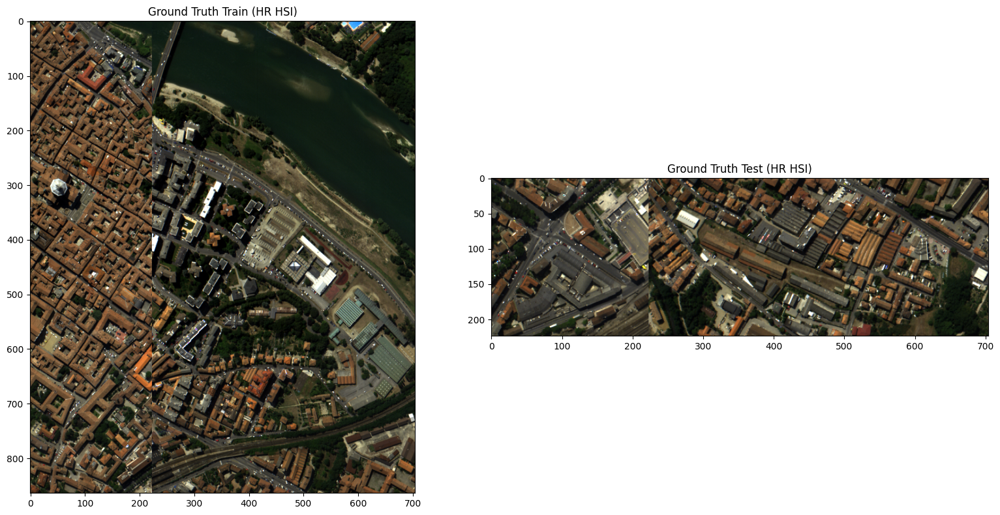

MSI train shape:  (864, 704, 1)
MSI test shape:  (224, 704, 1)


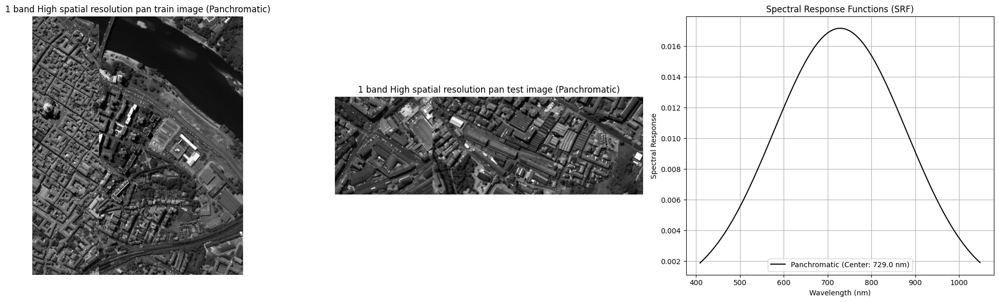

MSI train shape:  (864, 704, 3)
MSI test shape:  (224, 704, 3)


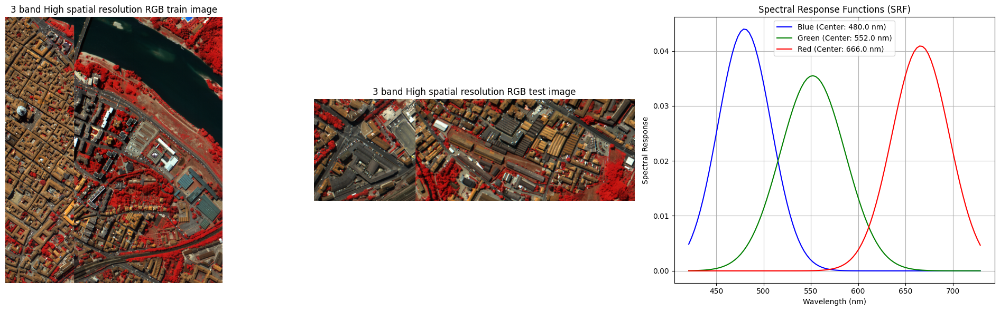

MSI train shape:  (864, 704, 4)
MSI test shape:  (224, 704, 4)


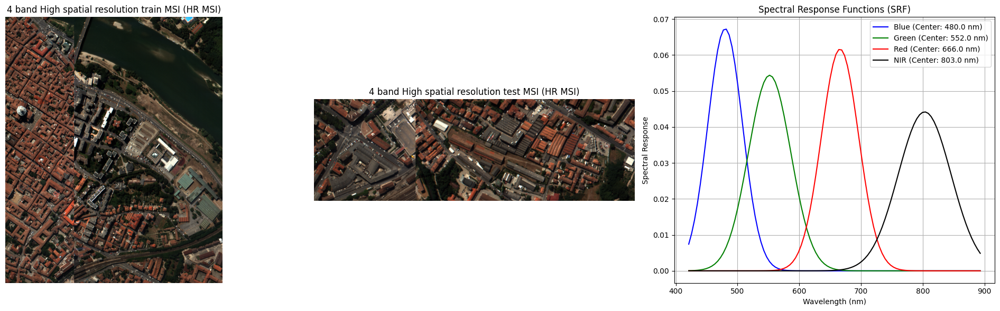

MSI train shape:  (864, 704, 8)
MSI test shape:  (224, 704, 8)


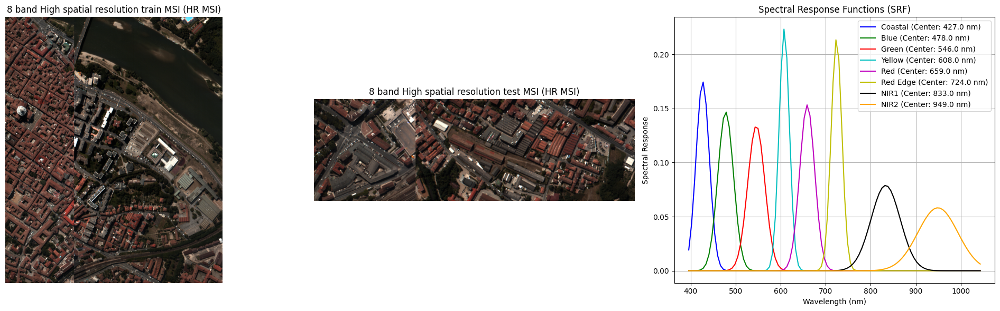

MSI train shape:  (864, 704, 16)
MSI test shape:  (224, 704, 16)


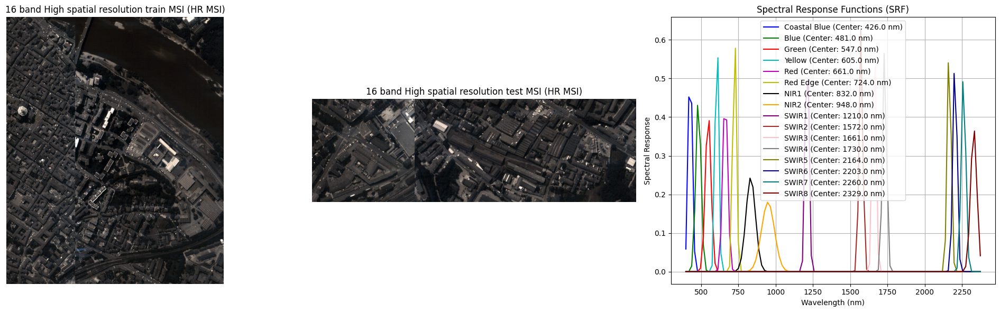

In [11]:
pavia_center = sio.loadmat(mat_file_path)
pavia_center_image = pavia_center['pavia']
pavia_center_image = pavia_center_image[:1088, :704, :]

# Ground Truth HR HSI (H, W, C)
I_REF = normalize(pavia_center_image)
I_REF_train, I_REF_test = split_msi(I_REF)
print("Ground truth train shape: ", I_REF_train.shape)
print("Ground truth test shape: ", I_REF_test.shape)
visualize_hsi(I_REF_train, I_REF_test, (50,35,15), "Ground Truth Train (HR HSI)", "Ground Truth Test (HR HSI)")

# High Resolution MSI with 1 band
I_MS_1, srf_1, band_specs_1, auto_wavs_1 = spectral_degradation(image=pavia_center_image, SNR=40, num_bands=1, fwhm_factor=4.2)
I_MS_1_train, I_MS_1_test = split_msi(I_MS_1)
print("MSI train shape: ", I_MS_1_train.shape)
print("MSI test shape: ", I_MS_1_test.shape)
plot_multispectral_with_srf(I_MS_1_train, I_MS_1_test, None, "1 band High spatial resolution pan train image", "1 band High spatial resolution pan test image", srf_1, auto_wavs_1, band_specs_1)

# High Resolution MSI with 3 bands
I_MS_3, srf_3, band_specs_3, auto_wavs_3 = spectral_degradation(image=pavia_center_image, SNR=40, num_bands=3, fwhm_factor=4.2)
I_MS_3_train, I_MS_3_test = split_msi(I_MS_3)
print("MSI train shape: ", I_MS_3_train.shape)
print("MSI test shape: ", I_MS_3_test.shape)
plot_multispectral_with_srf(I_MS_3_train, I_MS_3_test, (2,1,0), "3 band High spatial resolution RGB train image", "3 band High spatial resolution RGB test image", srf_3, auto_wavs_3, band_specs_3)

# High Resolution MSI with 4 bands
I_MS_4, srf_4, band_specs_4, auto_wavs_4 = spectral_degradation(image=pavia_center_image, SNR=40, num_bands=4, fwhm_factor=4.2)
I_MS_4_train, I_MS_4_test = split_msi(I_MS_4)
print("MSI train shape: ", I_MS_4_train.shape)
print("MSI test shape: ", I_MS_4_test.shape)
plot_multispectral_with_srf(I_MS_4_train, I_MS_4_test, (2,1,0), "4 band High spatial resolution train MSI (HR MSI)", "4 band High spatial resolution test MSI (HR MSI)", srf_4, auto_wavs_4, band_specs_4)

# High Resolution MSI with 8 bands
I_MS_8, srf_8, band_specs_8, auto_wavs_8 = spectral_degradation(image=pavia_center_image, SNR=40, num_bands=8, fwhm_factor=4.2)
I_MS_8_train, I_MS_8_test = split_msi(I_MS_8)
print("MSI train shape: ", I_MS_8_train.shape)
print("MSI test shape: ", I_MS_8_test.shape)
plot_multispectral_with_srf(I_MS_8_train, I_MS_8_test, (4,2,1), "8 band High spatial resolution train MSI (HR MSI)", "8 band High spatial resolution test MSI (HR MSI)", srf_8, auto_wavs_8, band_specs_8)

# High Resolution MSI with 16 bands
I_MS_16, srf_16, band_specs_16, auto_wavs_16 = spectral_degradation(image=pavia_center_image, SNR=40, num_bands=16, fwhm_factor=4.2)
I_MS_16_train, I_MS_16_test = split_msi(I_MS_16)
print("MSI train shape: ", I_MS_16_train.shape)
print("MSI test shape: ", I_MS_16_test.shape)
plot_multispectral_with_srf(I_MS_16_train, I_MS_16_test, (4,2,1), "16 band High spatial resolution train MSI (HR MSI)", "16 band High spatial resolution test MSI (HR MSI)", srf_16, auto_wavs_16, band_specs_16)

Setting up and visualizing the HSI images with Gaussian PSF

HSI train shape with 4x Downsample:  (216, 176, 102)
HSI test shape with 4x Downsample:  (56, 176, 102)


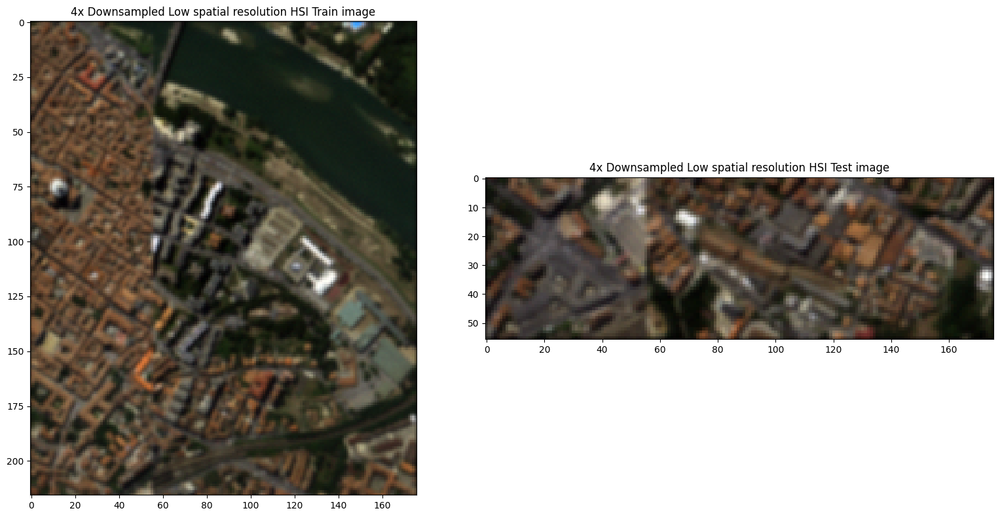

HSI train shape with 8x Downsample:  (108, 88, 102)
HSI test shape with 8x Downsample:  (28, 88, 102)


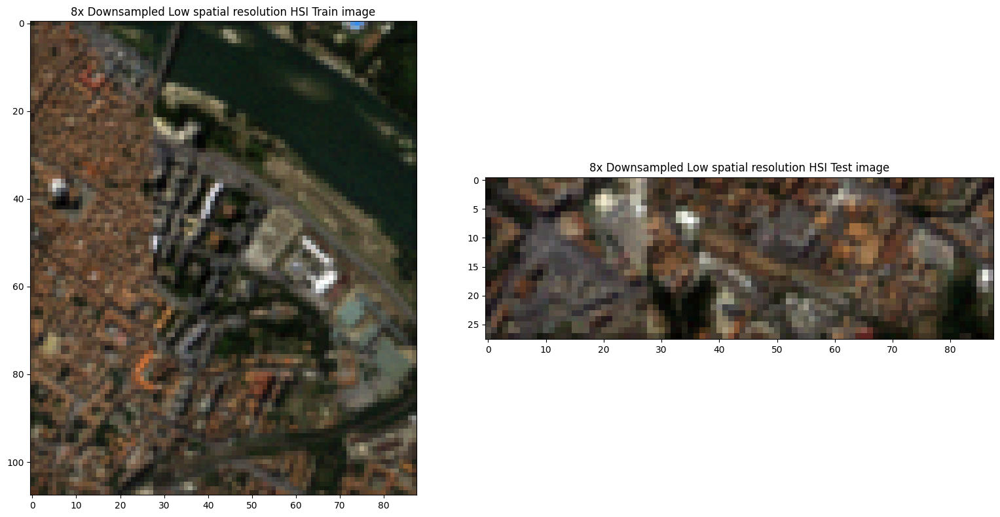

HSI train shape with 16x Downsample:  (54, 44, 102)
HSI test shape with 16x Downsample:  (14, 44, 102)


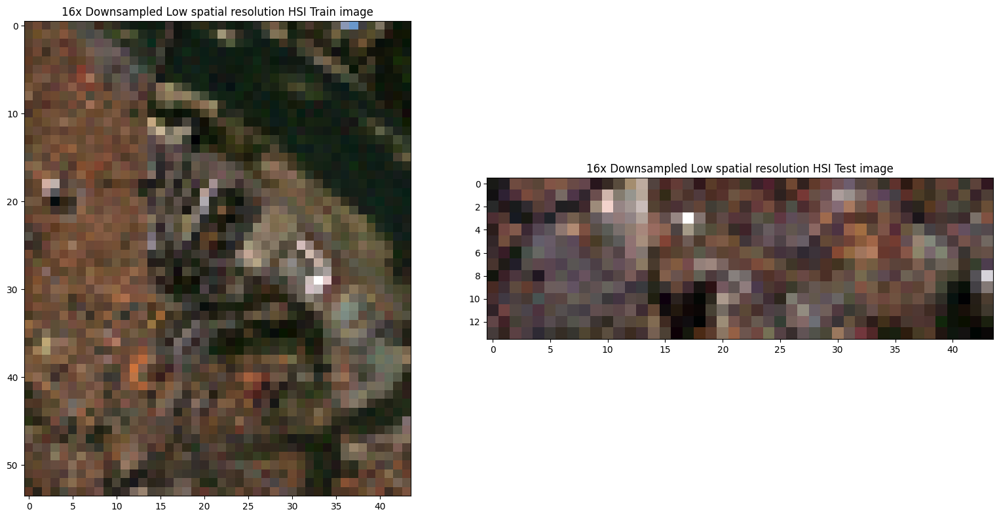

HSI train shape with 32x Downsample:  (27, 22, 102)
HSI test shape with 32x Downsample:  (7, 22, 102)


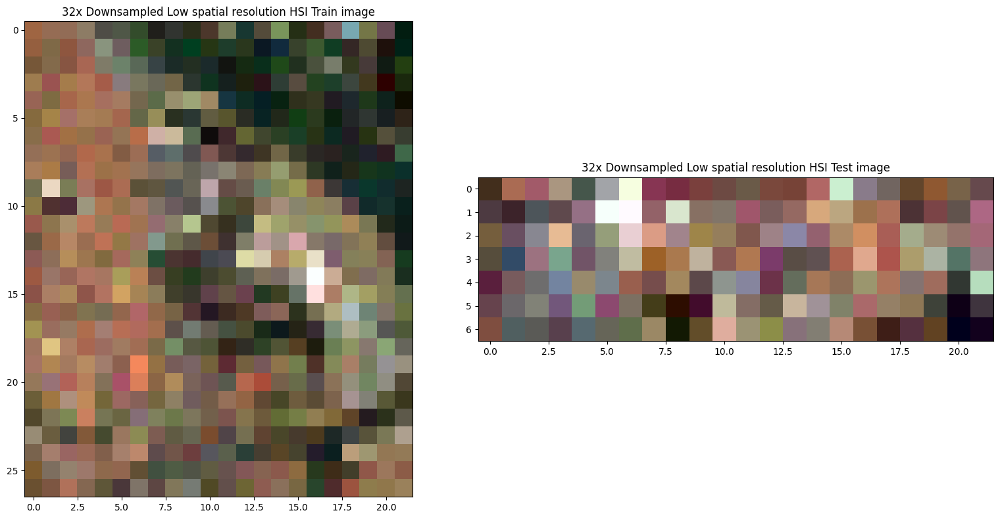

In [12]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_gaus = spatial_degradation(pavia_center_image, gaus_psf, 4, 35)
I_HS_4_train_gaus, I_HS_4_test_gaus = split_lr_hsi(I_HS_4_gaus, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_gaus.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_gaus.shape)
visualize_hsi(I_HS_4_train_gaus, I_HS_4_test_gaus, (50,35,15), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_gaus = spatial_degradation(pavia_center_image, gaus_psf, 8, 30)
I_HS_8_train_gaus, I_HS_8_test_gaus = split_lr_hsi(I_HS_8_gaus, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_gaus.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_gaus.shape)
visualize_hsi(I_HS_8_train_gaus, I_HS_8_test_gaus, (50,35,15), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_gaus = spatial_degradation(pavia_center_image, gaus_psf, 16, 25)
I_HS_16_train_gaus, I_HS_16_test_gaus = split_lr_hsi(I_HS_16_gaus, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_gaus.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_gaus.shape)
visualize_hsi(I_HS_16_train_gaus, I_HS_16_test_gaus, (50,35,15), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_gaus = spatial_degradation(pavia_center_image, gaus_psf, 32, 20)
I_HS_32_train_gaus, I_HS_32_test_gaus = split_lr_hsi(I_HS_32_gaus, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_gaus.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_gaus.shape)
visualize_hsi(I_HS_32_train_gaus, I_HS_32_test_gaus, (50,35,15), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Kolmogorov PSF

HSI train shape with 4x Downsample:  (216, 176, 102)
HSI test shape with 4x Downsample:  (56, 176, 102)


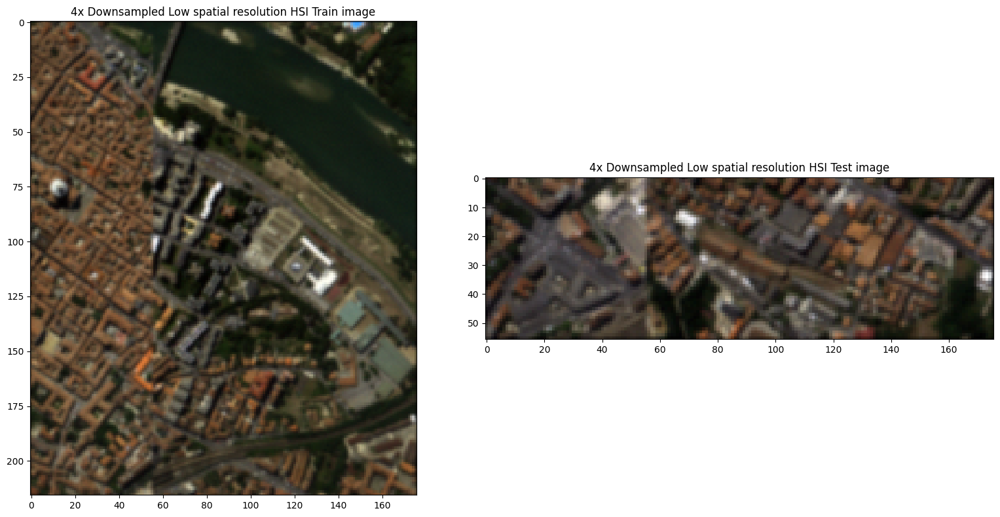

HSI train shape with 8x Downsample:  (108, 88, 102)
HSI test shape with 8x Downsample:  (28, 88, 102)


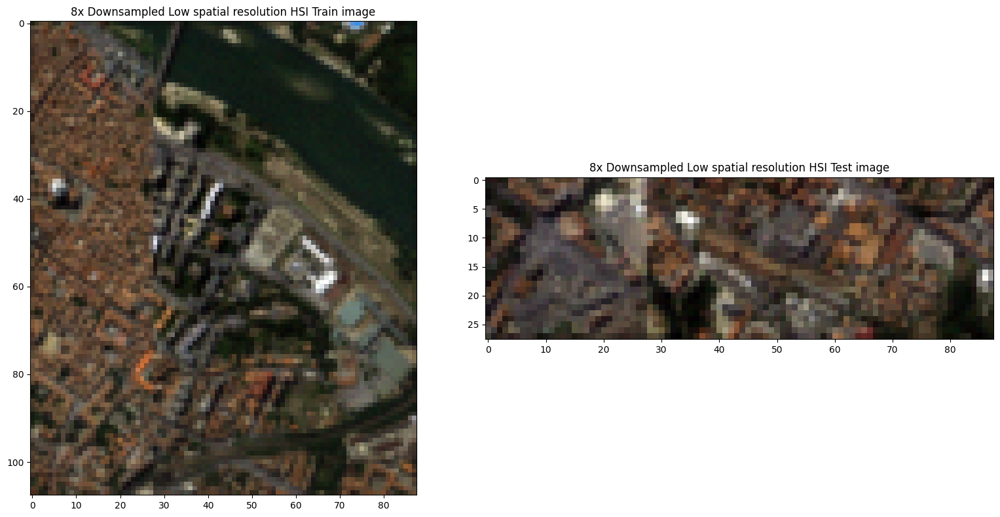

HSI train shape with 16x Downsample:  (54, 44, 102)
HSI test shape with 16x Downsample:  (14, 44, 102)


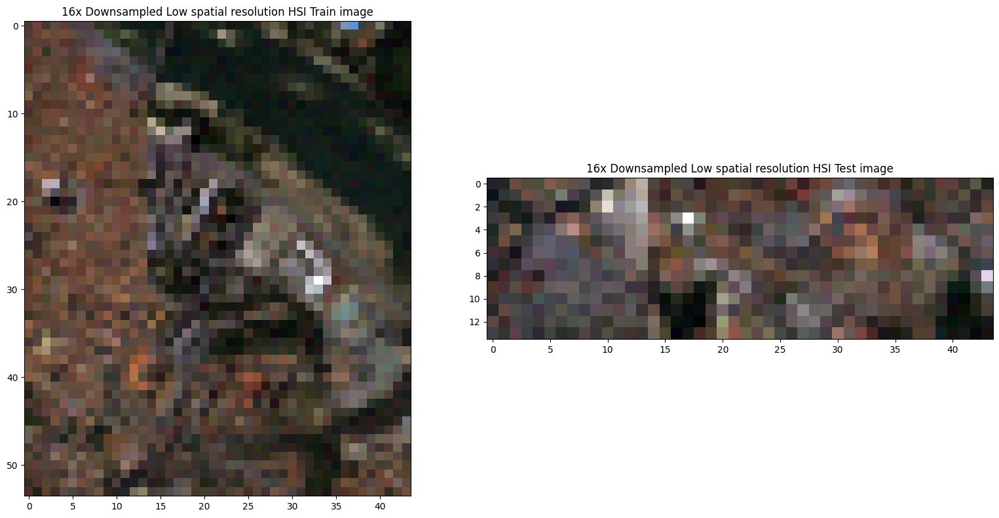

HSI train shape with 32x Downsample:  (27, 22, 102)
HSI test shape with 32x Downsample:  (7, 22, 102)


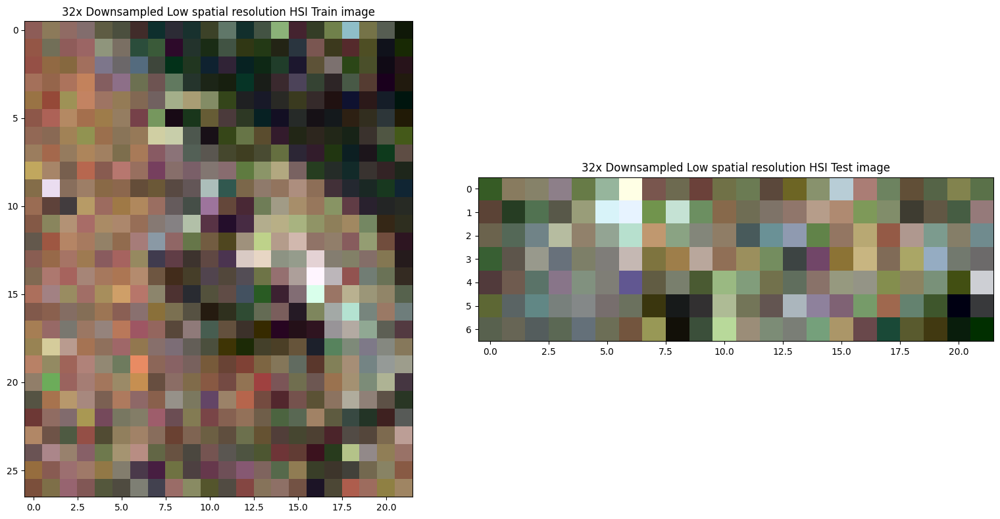

In [13]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_kol = spatial_degradation(pavia_center_image, kol_psf, 4, 35)
I_HS_4_train_kol, I_HS_4_test_kol = split_lr_hsi(I_HS_4_kol, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_kol.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_kol.shape)
visualize_hsi(I_HS_4_train_kol, I_HS_4_test_kol, (50,35,15), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_kol = spatial_degradation(pavia_center_image, kol_psf, 8, 30)
I_HS_8_train_kol, I_HS_8_test_kol = split_lr_hsi(I_HS_8_kol, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_kol.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_kol.shape)
visualize_hsi(I_HS_8_train_kol, I_HS_8_test_kol, (50,35,15), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_kol = spatial_degradation(pavia_center_image, kol_psf, 16, 25)
I_HS_16_train_kol, I_HS_16_test_kol = split_lr_hsi(I_HS_16_kol, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_kol.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_kol.shape)
visualize_hsi(I_HS_16_train_kol, I_HS_16_test_kol, (50,35,15), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_kol = spatial_degradation(pavia_center_image, kol_psf, 32, 20)
I_HS_32_train_kol, I_HS_32_test_kol = split_lr_hsi(I_HS_32_kol, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_kol.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_kol.shape)
visualize_hsi(I_HS_32_train_kol, I_HS_32_test_kol, (50,35,15), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Airy PSF

HSI train shape with 4x Downsample:  (216, 176, 102)
HSI test shape with 4x Downsample:  (56, 176, 102)


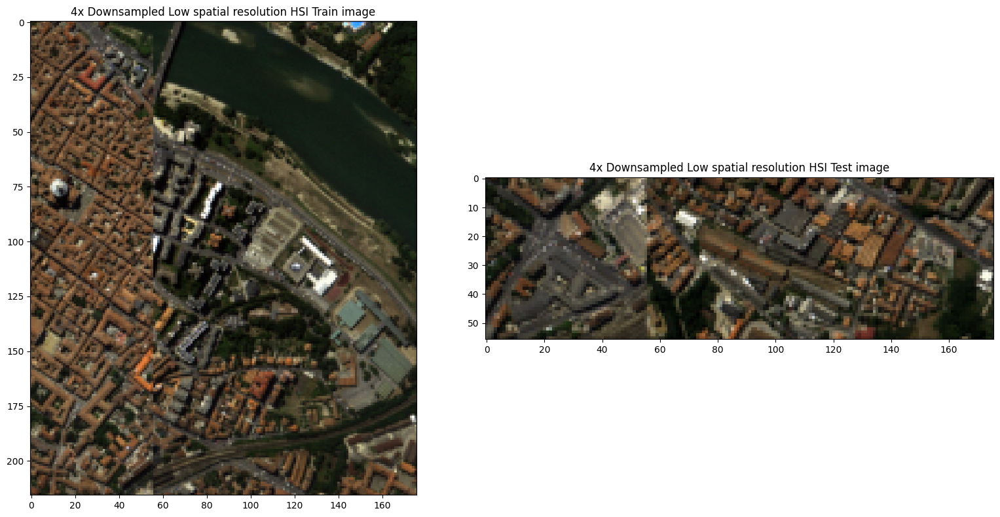

HSI train shape with 8x Downsample:  (108, 88, 102)
HSI test shape with 8x Downsample:  (28, 88, 102)


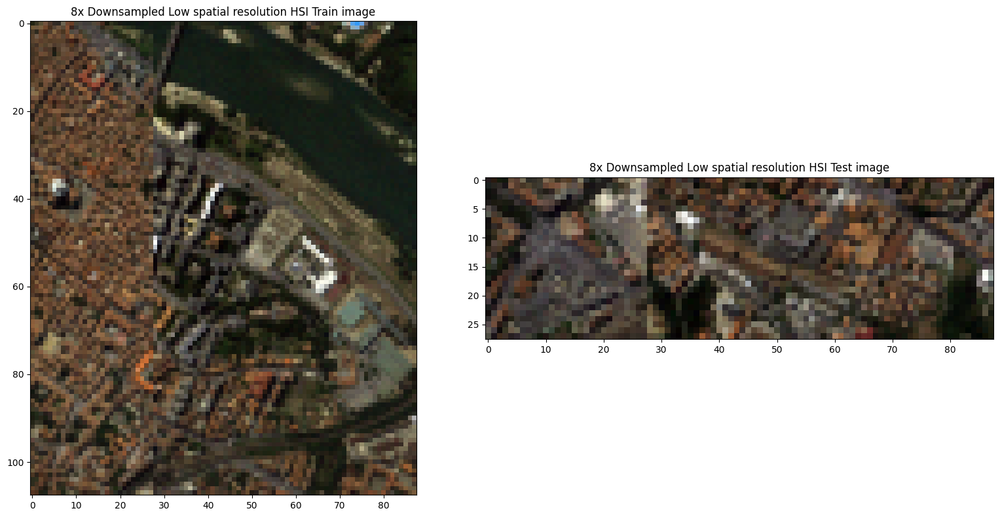

HSI train shape with 16x Downsample:  (54, 44, 102)
HSI test shape with 16x Downsample:  (14, 44, 102)


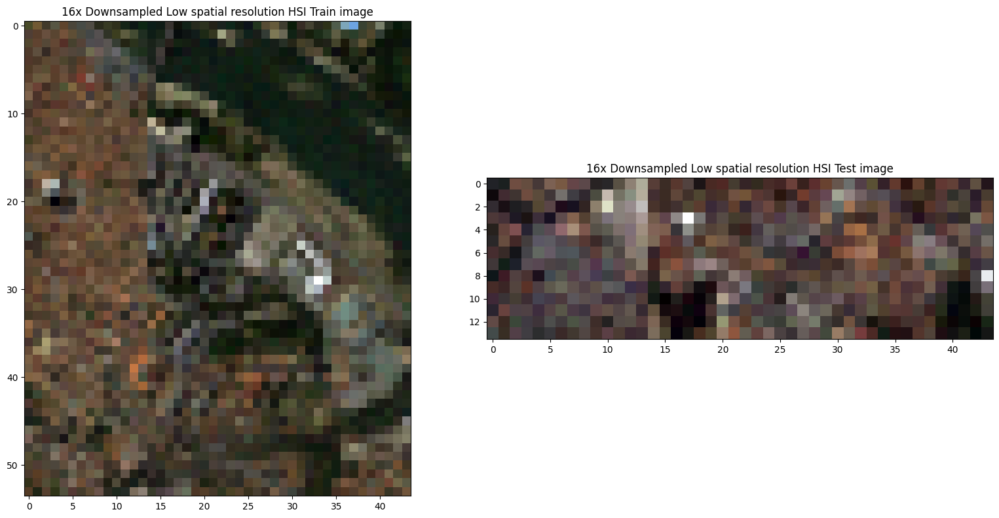

HSI train shape with 32x Downsample:  (27, 22, 102)
HSI test shape with 32x Downsample:  (7, 22, 102)


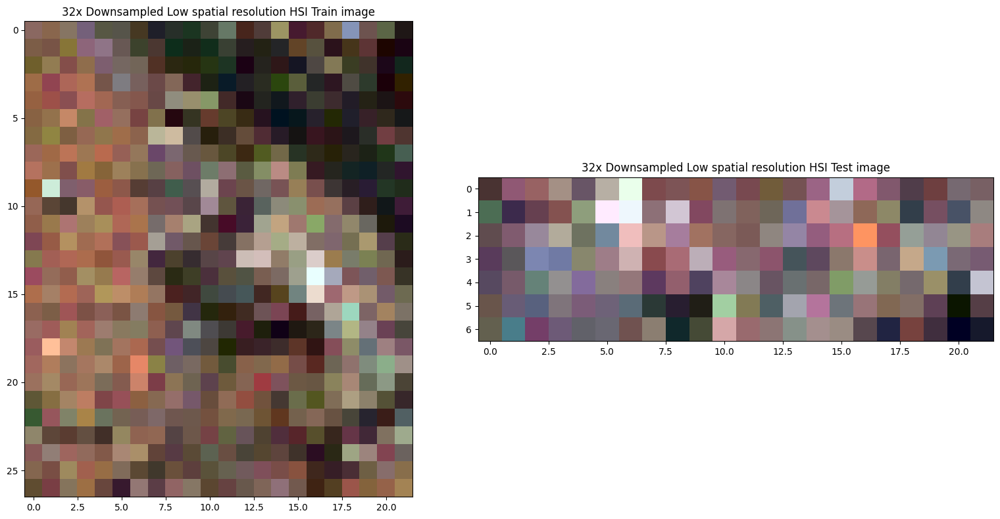

In [14]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_air = spatial_degradation(pavia_center_image, air_psf, 4, 35)
I_HS_4_train_air, I_HS_4_test_air = split_lr_hsi(I_HS_4_air, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_air.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_air.shape)
visualize_hsi(I_HS_4_train_air, I_HS_4_test_air, (50,35,15), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_air = spatial_degradation(pavia_center_image, air_psf, 8, 30)
I_HS_8_train_air, I_HS_8_test_air = split_lr_hsi(I_HS_8_air, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_air.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_air.shape)
visualize_hsi(I_HS_8_train_air, I_HS_8_test_air, (50,35,15), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_air = spatial_degradation(pavia_center_image, air_psf, 16, 25)
I_HS_16_train_air, I_HS_16_test_air = split_lr_hsi(I_HS_16_air, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_air.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_air.shape)
visualize_hsi(I_HS_16_train_air, I_HS_16_test_air, (50,35,15), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_air = spatial_degradation(pavia_center_image, air_psf, 32, 20)
I_HS_32_train_air, I_HS_32_test_air = split_lr_hsi(I_HS_32_air, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_air.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_air.shape)
visualize_hsi(I_HS_32_train_air, I_HS_32_test_air, (50,35,15), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Moffat PSF

HSI train shape with 4x Downsample:  (216, 176, 102)
HSI test shape with 4x Downsample:  (56, 176, 102)


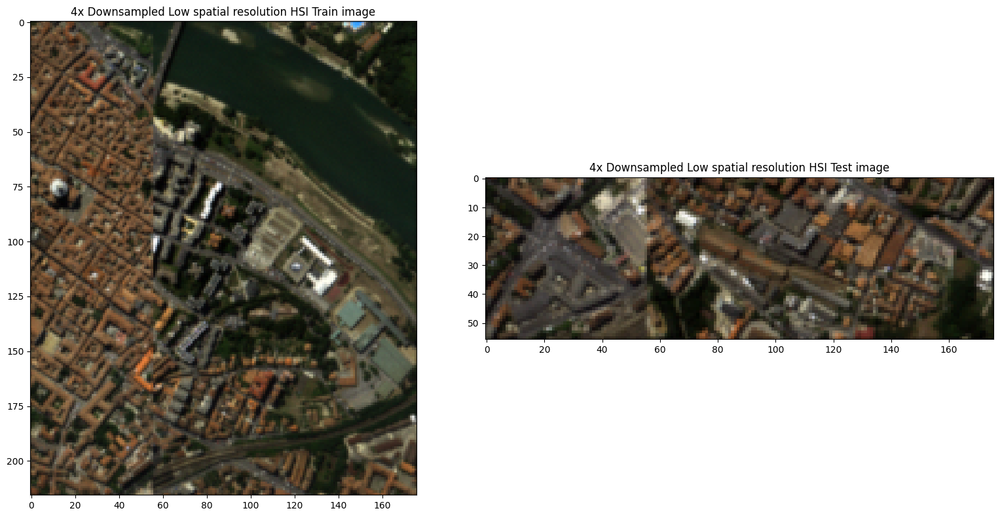

HSI train shape with 8x Downsample:  (108, 88, 102)
HSI test shape with 8x Downsample:  (28, 88, 102)


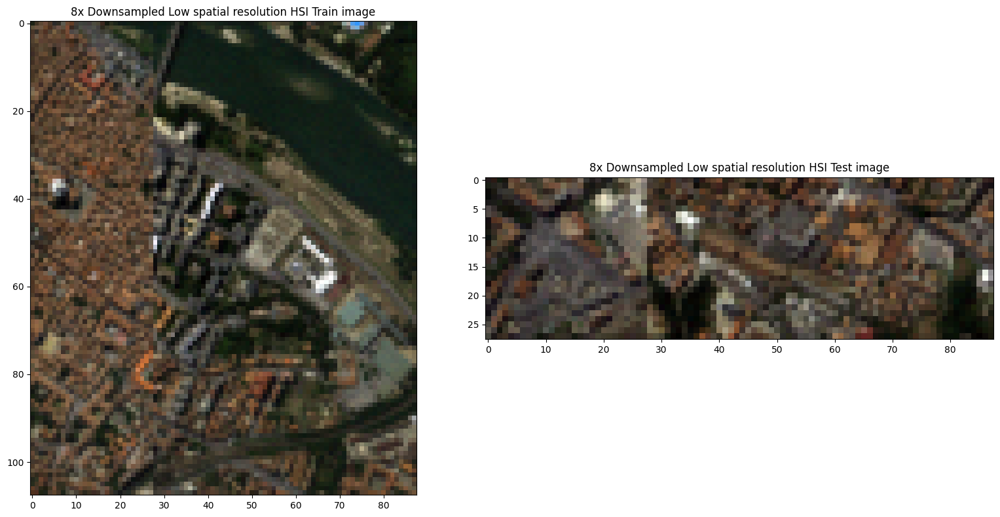

HSI train shape with 16x Downsample:  (54, 44, 102)
HSI test shape with 16x Downsample:  (14, 44, 102)


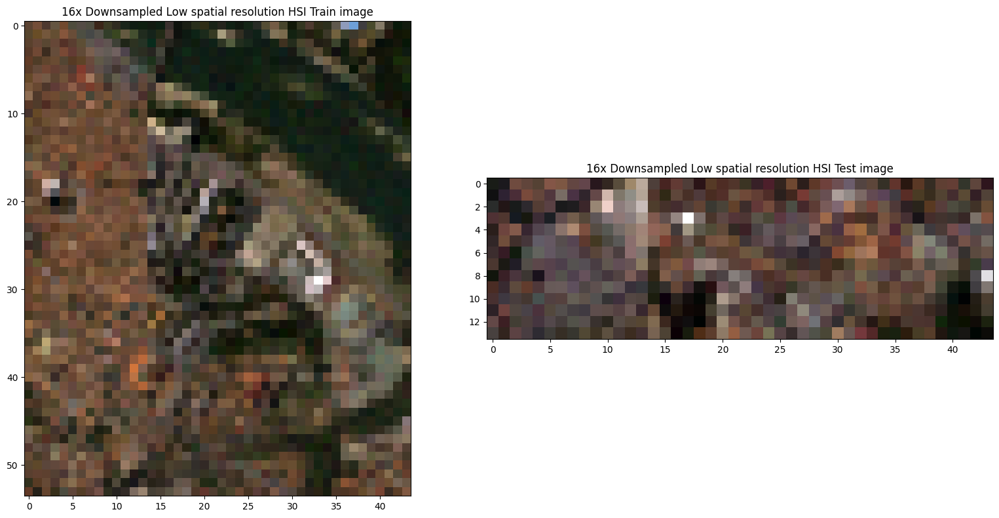

HSI train shape with 32x Downsample:  (27, 22, 102)
HSI test shape with 32x Downsample:  (7, 22, 102)


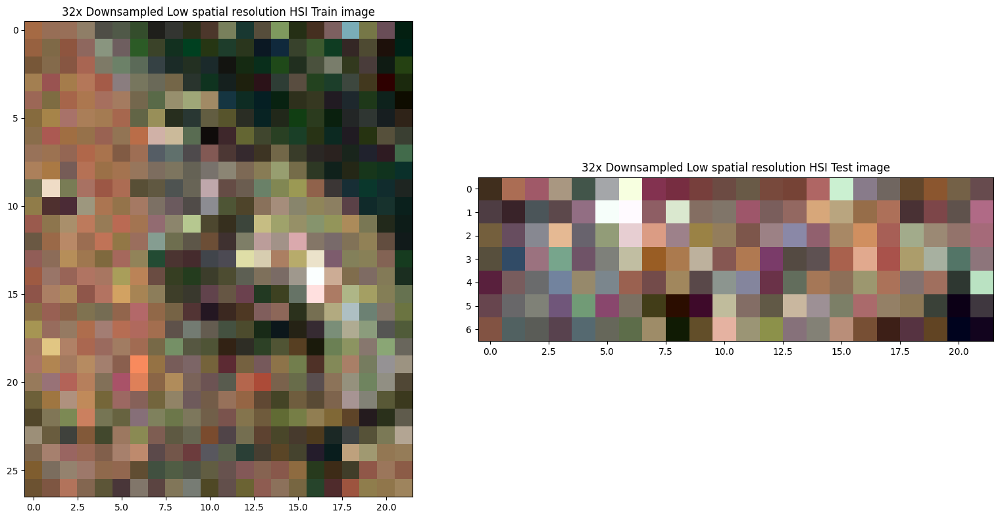

In [12]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_mof = spatial_degradation(pavia_center_image, mof_psf, 4, 35)
I_HS_4_train_mof, I_HS_4_test_mof = split_lr_hsi(I_HS_4_mof, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_mof.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_mof.shape)
visualize_hsi(I_HS_4_train_mof, I_HS_4_test_mof, (50,35,15), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_mof = spatial_degradation(pavia_center_image, mof_psf, 8, 30)
I_HS_8_train_mof, I_HS_8_test_mof = split_lr_hsi(I_HS_8_mof, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_mof.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_mof.shape)
visualize_hsi(I_HS_8_train_mof, I_HS_8_test_mof, (50,35,15), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_mof = spatial_degradation(pavia_center_image, mof_psf, 16, 25)
I_HS_16_train_mof, I_HS_16_test_mof = split_lr_hsi(I_HS_16_mof, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_mof.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_mof.shape)
visualize_hsi(I_HS_16_train_mof, I_HS_16_test_mof, (50,35,15), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_mof = spatial_degradation(pavia_center_image, mof_psf, 32, 20)
I_HS_32_train_mof, I_HS_32_test_mof = split_lr_hsi(I_HS_32_mof, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_mof.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_mof.shape)
visualize_hsi(I_HS_32_train_mof, I_HS_32_test_mof, (50,35,15), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Sinc PSF

HSI train shape with 4x Downsample:  (216, 176, 102)
HSI test shape with 4x Downsample:  (56, 176, 102)


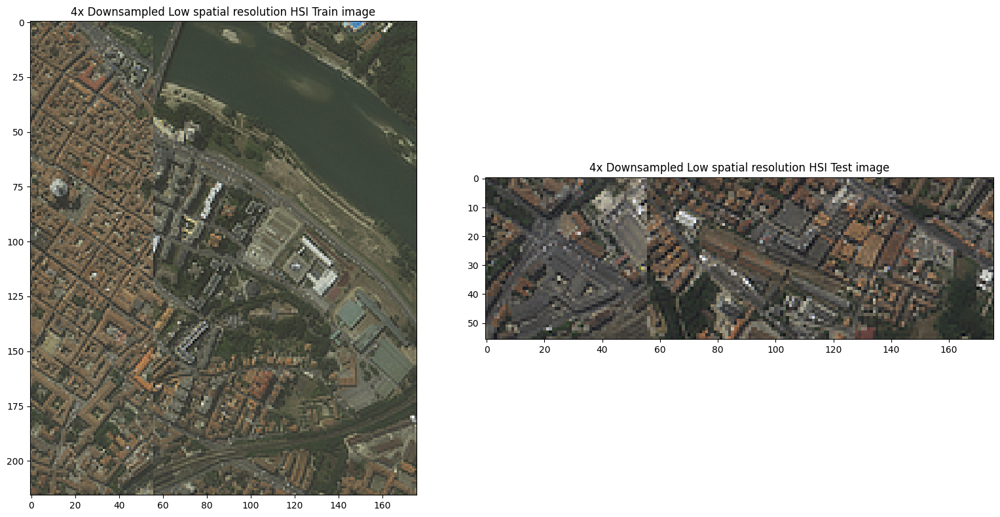

HSI train shape with 8x Downsample:  (108, 88, 102)
HSI test shape with 8x Downsample:  (28, 88, 102)


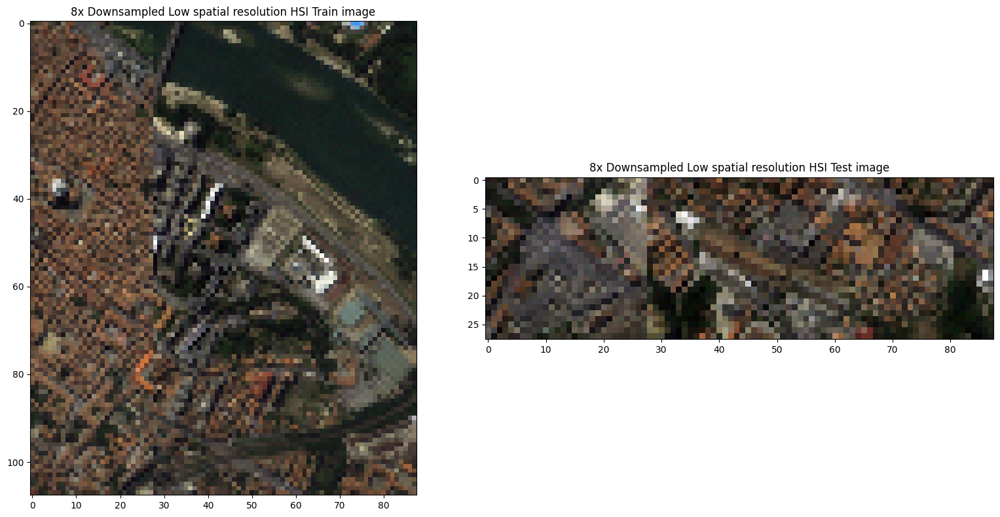

HSI train shape with 16x Downsample:  (54, 44, 102)
HSI test shape with 16x Downsample:  (14, 44, 102)


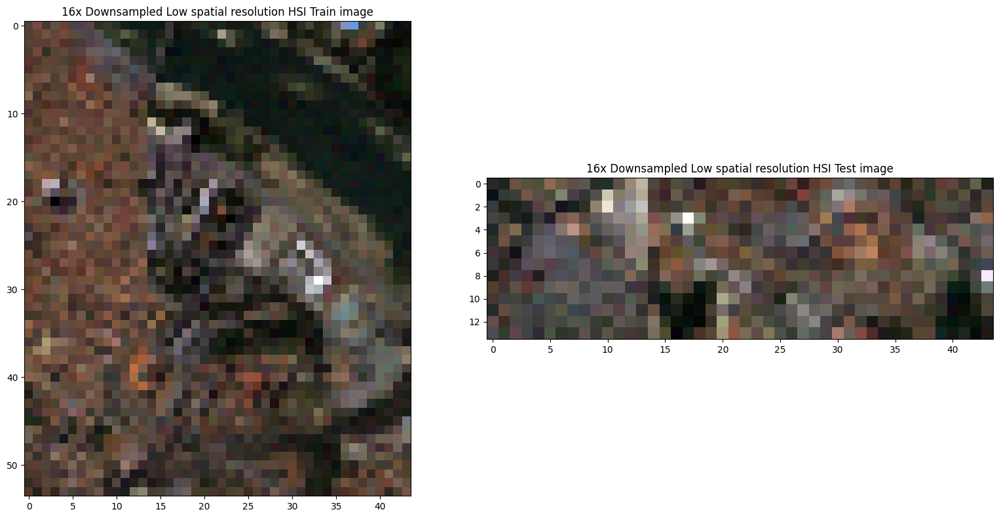

HSI train shape with 32x Downsample:  (27, 22, 102)
HSI test shape with 32x Downsample:  (7, 22, 102)


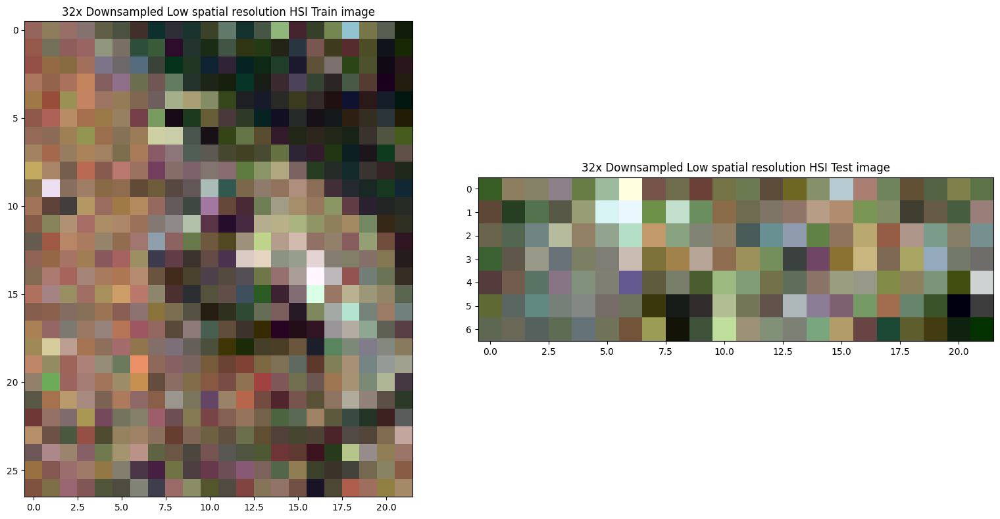

In [13]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_sinc = spatial_degradation(pavia_center_image, sinc_psf, 4, 35)
I_HS_4_train_sinc, I_HS_4_test_sinc = split_lr_hsi(I_HS_4_sinc, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_sinc.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_sinc.shape)
visualize_hsi(I_HS_4_train_sinc, I_HS_4_test_sinc, (50,35,15), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_sinc = spatial_degradation(pavia_center_image, sinc_psf, 8, 30)
I_HS_8_train_sinc, I_HS_8_test_sinc = split_lr_hsi(I_HS_8_sinc, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_sinc.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_sinc.shape)
visualize_hsi(I_HS_8_train_sinc, I_HS_8_test_sinc, (50,35,15), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_sinc = spatial_degradation(pavia_center_image, sinc_psf, 16, 25)
I_HS_16_train_sinc, I_HS_16_test_sinc = split_lr_hsi(I_HS_16_sinc, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_sinc.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_sinc.shape)
visualize_hsi(I_HS_16_train_sinc, I_HS_16_test_sinc, (50,35,15), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_sinc = spatial_degradation(pavia_center_image, sinc_psf, 32, 20)
I_HS_32_train_sinc, I_HS_32_test_sinc = split_lr_hsi(I_HS_32_sinc, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_sinc.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_sinc.shape)
visualize_hsi(I_HS_32_train_sinc, I_HS_32_test_sinc, (50,35,15), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Lorentzian Squared PSF

HSI train shape with 4x Downsample:  (216, 176, 102)
HSI test shape with 4x Downsample:  (56, 176, 102)


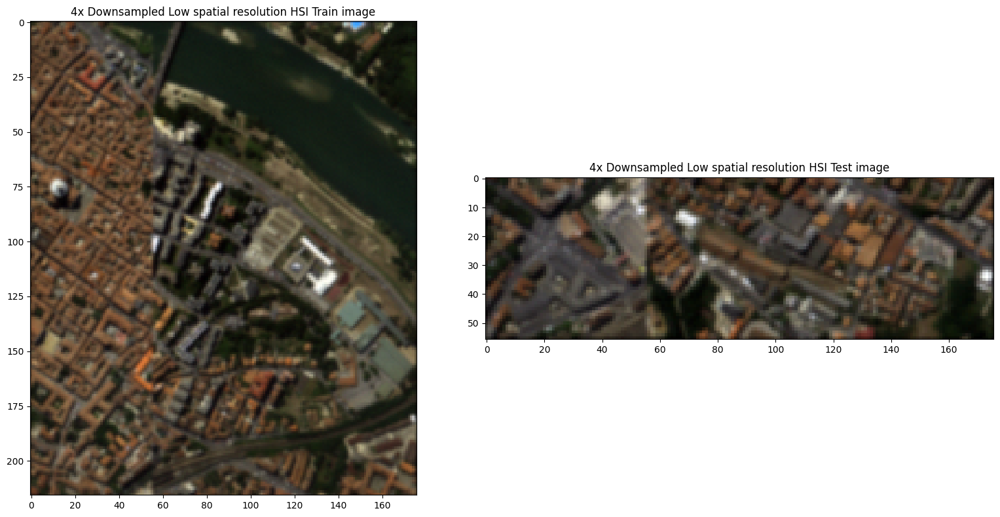

HSI train shape with 8x Downsample:  (108, 88, 102)
HSI test shape with 8x Downsample:  (28, 88, 102)


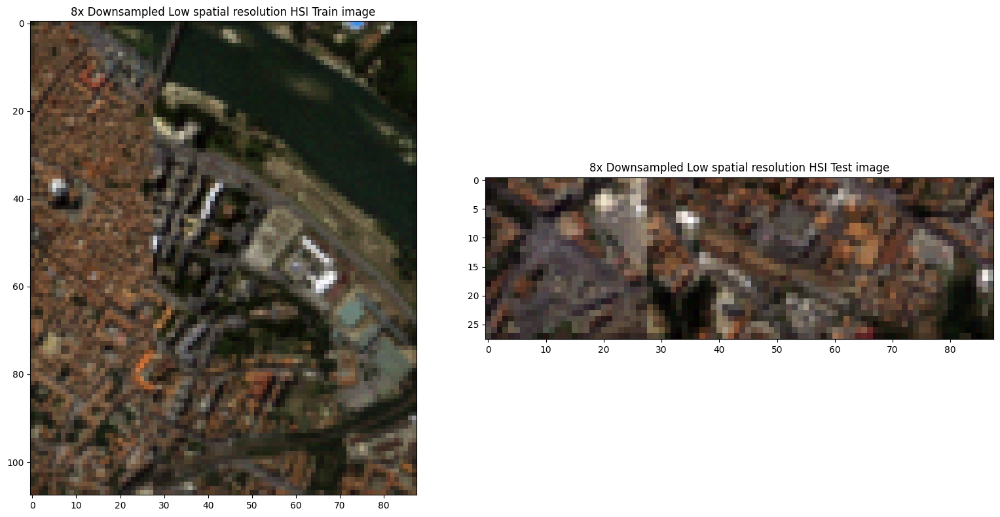

HSI train shape with 16x Downsample:  (54, 44, 102)
HSI test shape with 16x Downsample:  (14, 44, 102)


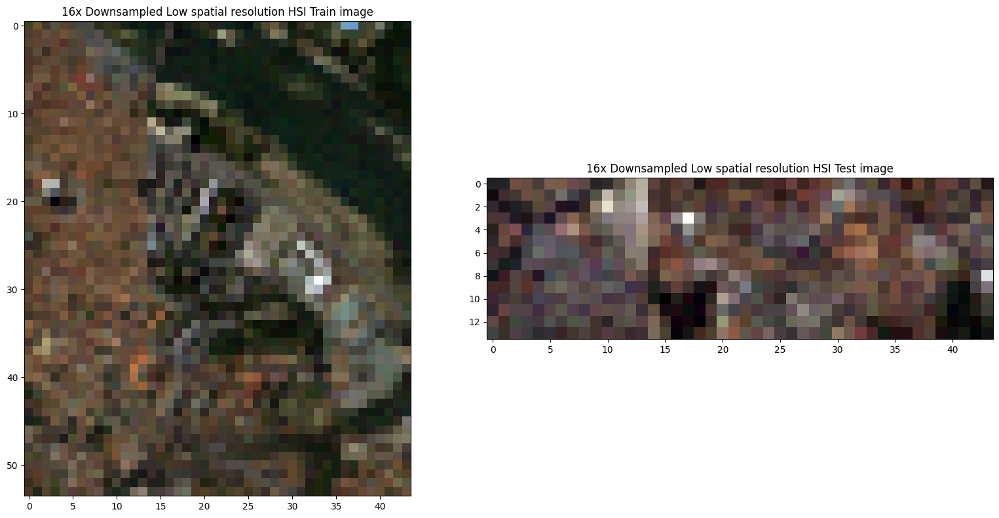

HSI train shape with 32x Downsample:  (27, 22, 102)
HSI test shape with 32x Downsample:  (7, 22, 102)


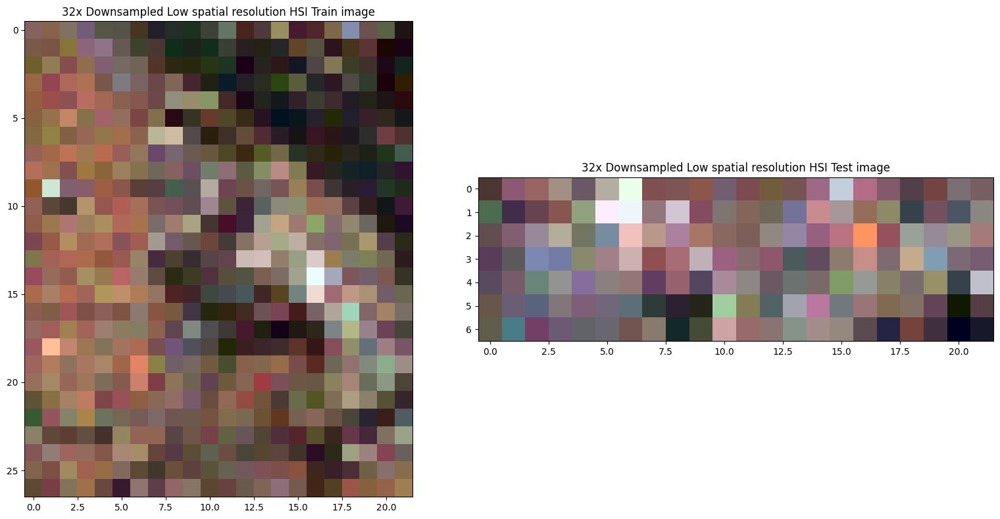

In [14]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_lor_sq = spatial_degradation(pavia_center_image, lor_sq_psf, 4, 35)
I_HS_4_train_lor_sq, I_HS_4_test_lor_sq = split_lr_hsi(I_HS_4_lor_sq, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_lor_sq.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_lor_sq.shape)
visualize_hsi(I_HS_4_train_lor_sq, I_HS_4_test_lor_sq, (50,35,15), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_lor_sq = spatial_degradation(pavia_center_image, lor_sq_psf, 8, 30)
I_HS_8_train_lor_sq, I_HS_8_test_lor_sq = split_lr_hsi(I_HS_8_lor_sq, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_lor_sq.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_lor_sq.shape)
visualize_hsi(I_HS_8_train_lor_sq, I_HS_8_test_lor_sq, (50,35,15), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_lor_sq = spatial_degradation(pavia_center_image, lor_sq_psf, 16, 25)
I_HS_16_train_lor_sq, I_HS_16_test_lor_sq = split_lr_hsi(I_HS_16_lor_sq, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_lor_sq.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_lor_sq.shape)
visualize_hsi(I_HS_16_train_lor_sq, I_HS_16_test_lor_sq, (50,35,15), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_lor_sq = spatial_degradation(pavia_center_image, lor_sq_psf, 32, 20)
I_HS_32_train_lor_sq, I_HS_32_test_lor_sq = split_lr_hsi(I_HS_32_lor_sq, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_lor_sq.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_lor_sq.shape)
visualize_hsi(I_HS_32_train_lor_sq, I_HS_32_test_lor_sq, (50,35,15), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Hermite PSF

HSI train shape with 4x Downsample:  (216, 176, 102)
HSI test shape with 4x Downsample:  (56, 176, 102)


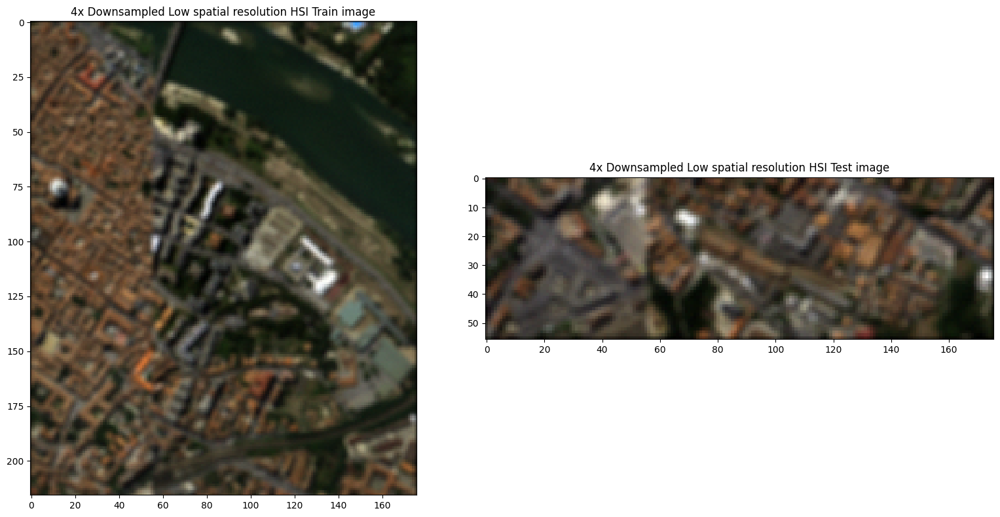

HSI train shape with 8x Downsample:  (108, 88, 102)
HSI test shape with 8x Downsample:  (28, 88, 102)


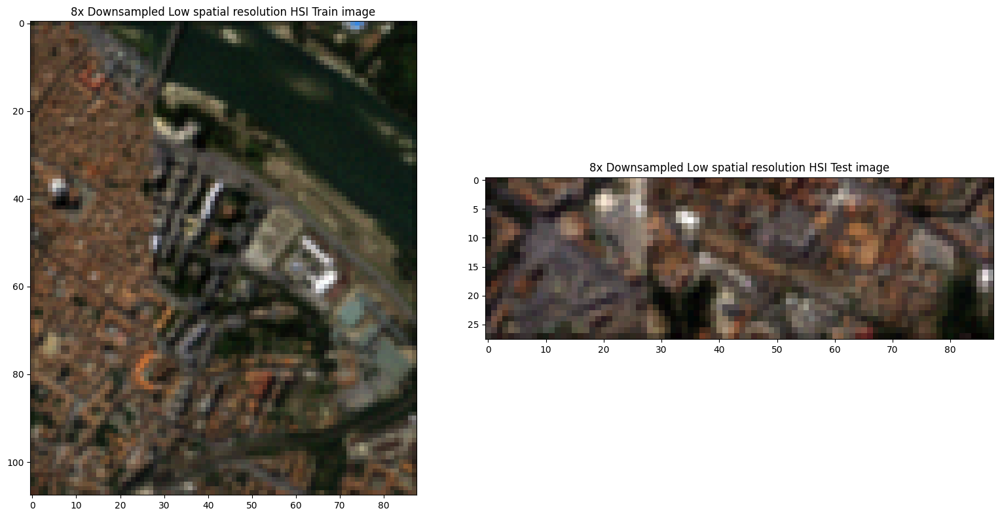

HSI train shape with 16x Downsample:  (54, 44, 102)
HSI test shape with 16x Downsample:  (14, 44, 102)


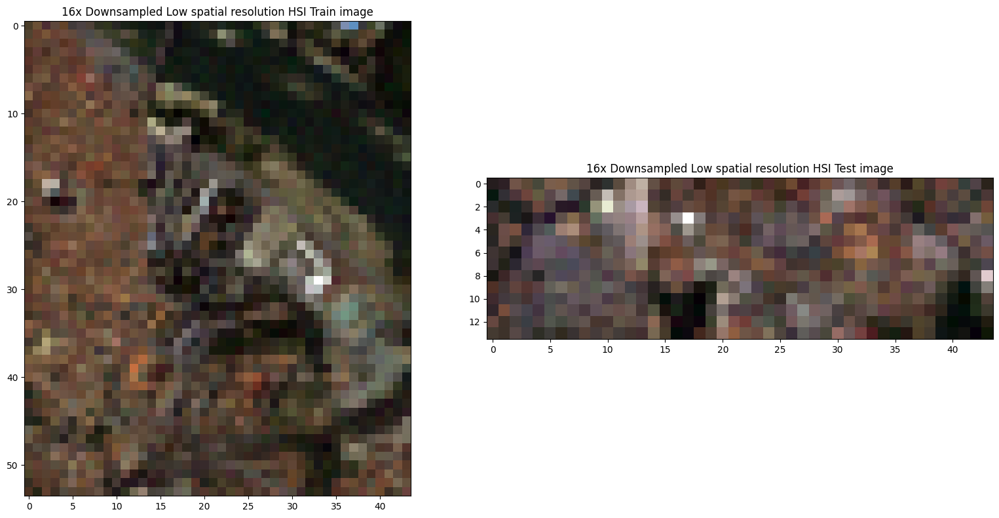

HSI train shape with 32x Downsample:  (27, 22, 102)
HSI test shape with 32x Downsample:  (7, 22, 102)


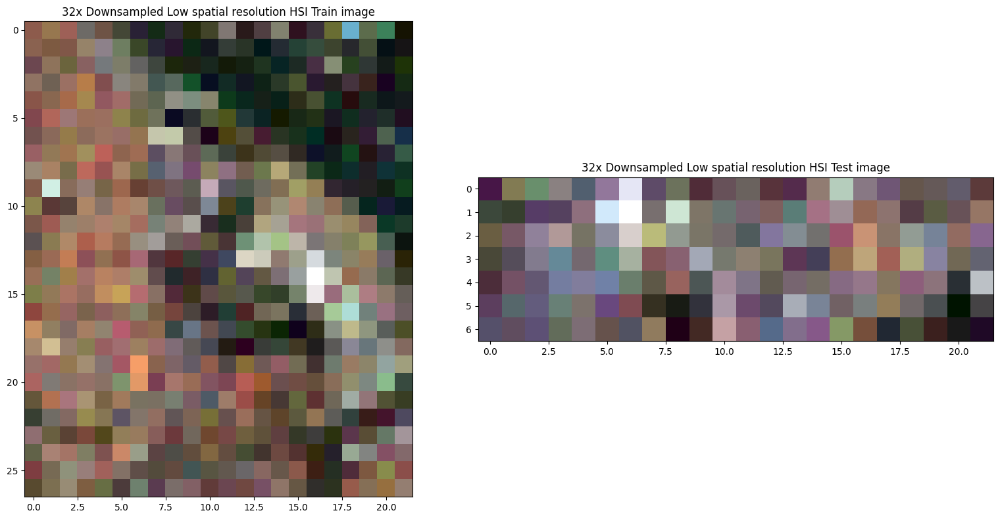

In [15]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_her = spatial_degradation(pavia_center_image, her_psf, 4, 35)
I_HS_4_train_her, I_HS_4_test_her = split_lr_hsi(I_HS_4_her, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_her.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_her.shape)
visualize_hsi(I_HS_4_train_her, I_HS_4_test_her, (50,35,15), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_her = spatial_degradation(pavia_center_image, her_psf, 8, 30)
I_HS_8_train_her, I_HS_8_test_her = split_lr_hsi(I_HS_8_her, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_her.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_her.shape)
visualize_hsi(I_HS_8_train_her, I_HS_8_test_her, (50,35,15), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_her = spatial_degradation(pavia_center_image, her_psf, 16, 25)
I_HS_16_train_her, I_HS_16_test_her = split_lr_hsi(I_HS_16_her, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_her.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_her.shape)
visualize_hsi(I_HS_16_train_her, I_HS_16_test_her, (50,35,15), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_her = spatial_degradation(pavia_center_image, her_psf, 32, 20)
I_HS_32_train_her, I_HS_32_test_her = split_lr_hsi(I_HS_32_her, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_her.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_her.shape)
visualize_hsi(I_HS_32_train_her, I_HS_32_test_her, (50,35,15), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Parabolic PSF

HSI train shape with 4x Downsample:  (216, 176, 102)
HSI test shape with 4x Downsample:  (56, 176, 102)


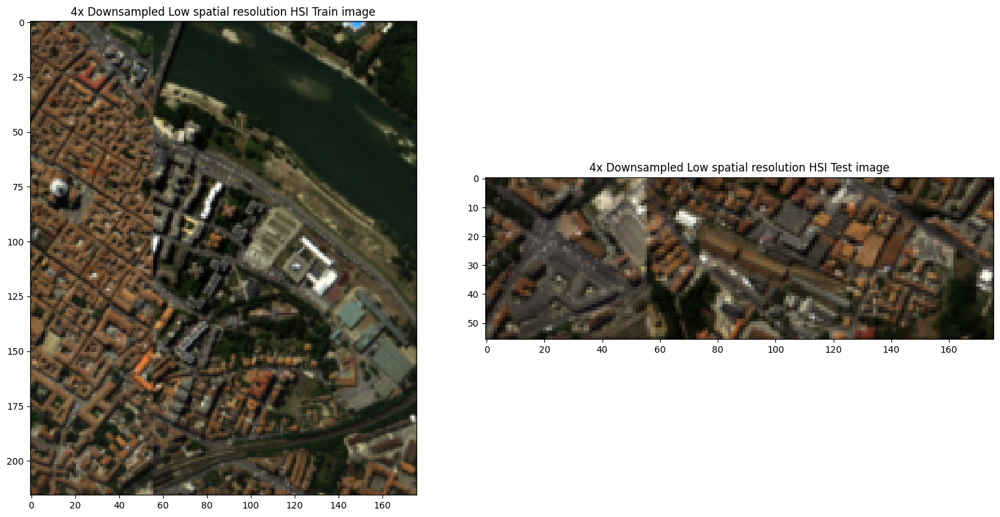

HSI train shape with 8x Downsample:  (108, 88, 102)
HSI test shape with 8x Downsample:  (28, 88, 102)


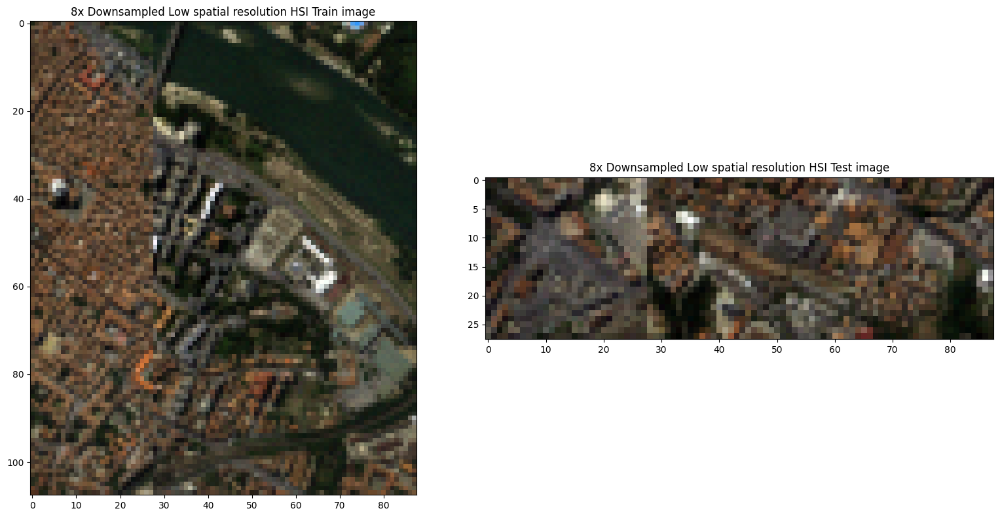

HSI train shape with 16x Downsample:  (54, 44, 102)
HSI test shape with 16x Downsample:  (14, 44, 102)


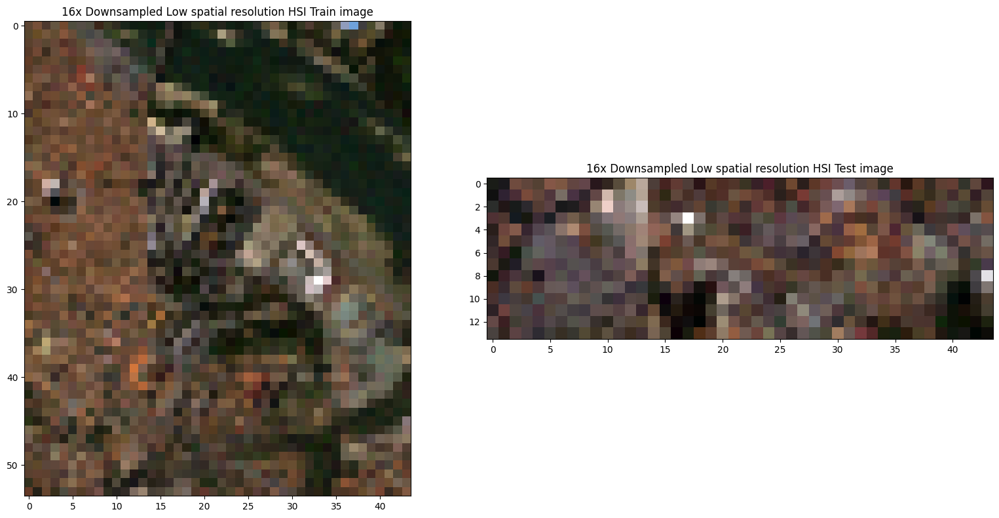

HSI train shape with 32x Downsample:  (27, 22, 102)
HSI test shape with 32x Downsample:  (7, 22, 102)


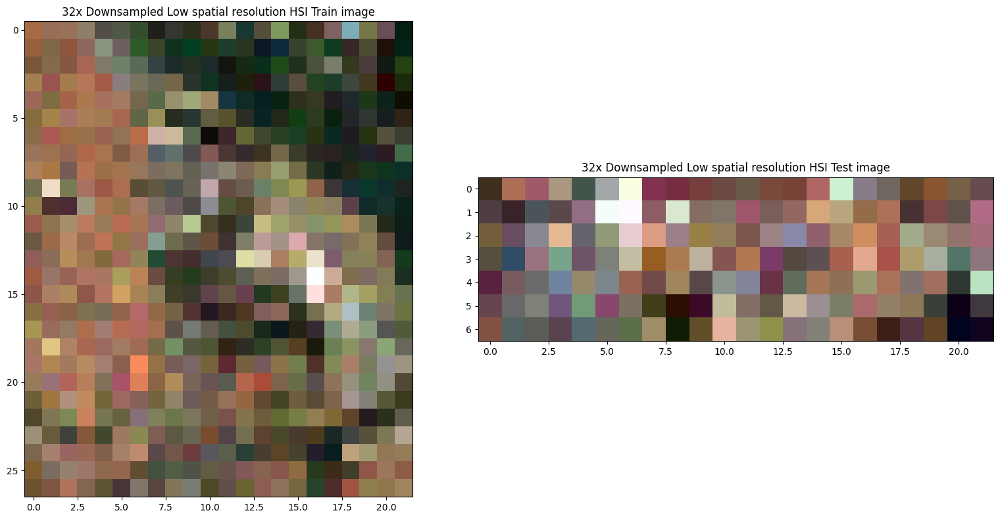

In [12]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_par = spatial_degradation(pavia_center_image, par_psf, 4, 35)
I_HS_4_train_par, I_HS_4_test_par = split_lr_hsi(I_HS_4_par, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_par.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_par.shape)
visualize_hsi(I_HS_4_train_par, I_HS_4_test_par, (50,35,15), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_par = spatial_degradation(pavia_center_image, par_psf, 8, 30)
I_HS_8_train_par, I_HS_8_test_par = split_lr_hsi(I_HS_8_par, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_par.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_par.shape)
visualize_hsi(I_HS_8_train_par, I_HS_8_test_par, (50,35,15), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_par = spatial_degradation(pavia_center_image, par_psf, 16, 25)
I_HS_16_train_par, I_HS_16_test_par = split_lr_hsi(I_HS_16_par, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_par.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_par.shape)
visualize_hsi(I_HS_16_train_par, I_HS_16_test_par, (50,35,15), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_par = spatial_degradation(pavia_center_image, par_psf, 32, 20)
I_HS_32_train_par, I_HS_32_test_par = split_lr_hsi(I_HS_32_par, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_par.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_par.shape)
visualize_hsi(I_HS_32_train_par, I_HS_32_test_par, (50,35,15), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Gabor PSF

HSI train shape with 4x Downsample:  (216, 176, 102)
HSI test shape with 4x Downsample:  (56, 176, 102)


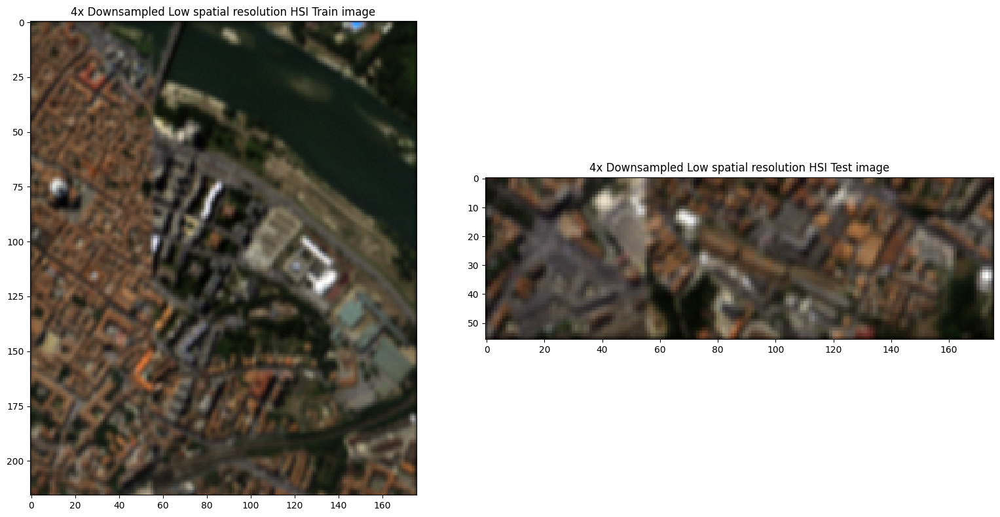

HSI train shape with 8x Downsample:  (108, 88, 102)
HSI test shape with 8x Downsample:  (28, 88, 102)


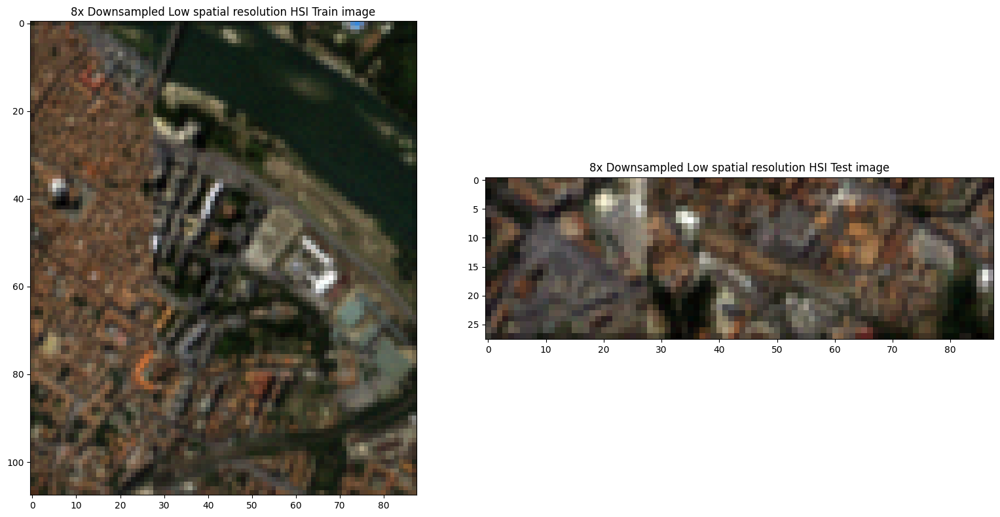

HSI train shape with 16x Downsample:  (54, 44, 102)
HSI test shape with 16x Downsample:  (14, 44, 102)


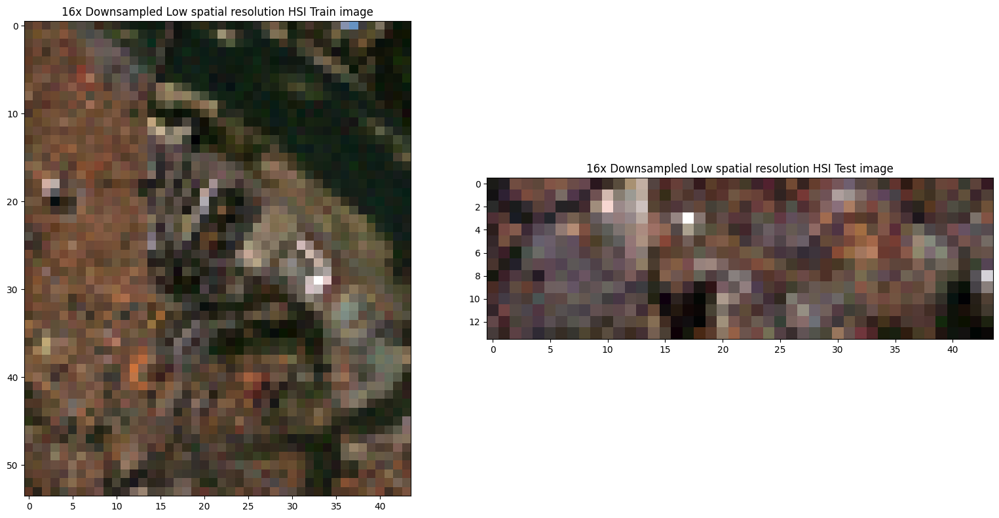

HSI train shape with 32x Downsample:  (27, 22, 102)
HSI test shape with 32x Downsample:  (7, 22, 102)


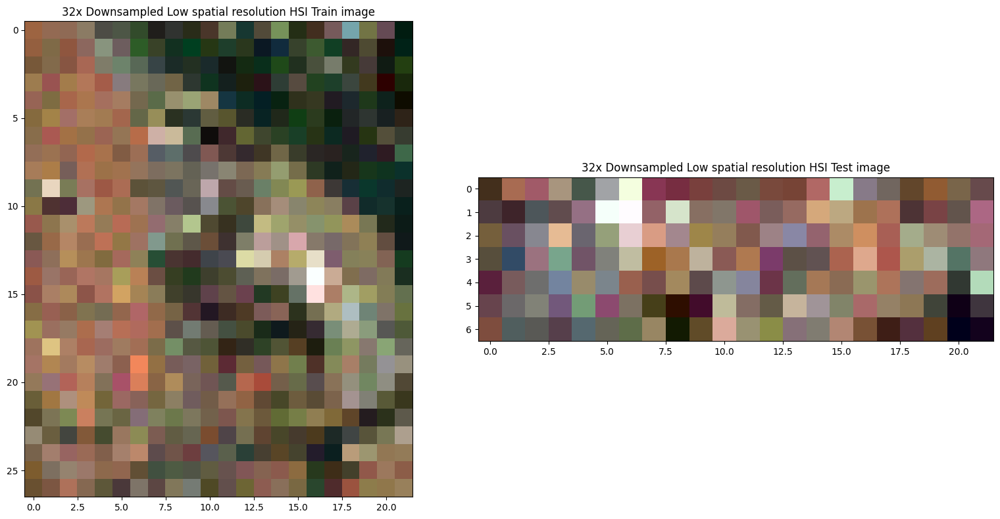

In [12]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_gab = spatial_degradation(pavia_center_image, gab_psf, 4, 35)
I_HS_4_train_gab, I_HS_4_test_gab = split_lr_hsi(I_HS_4_gab, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_gab.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_gab.shape)
visualize_hsi(I_HS_4_train_gab, I_HS_4_test_gab, (50,35,15), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_gab = spatial_degradation(pavia_center_image, gab_psf, 8, 30)
I_HS_8_train_gab, I_HS_8_test_gab = split_lr_hsi(I_HS_8_gab, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_gab.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_gab.shape)
visualize_hsi(I_HS_8_train_gab, I_HS_8_test_gab, (50,35,15), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_gab = spatial_degradation(pavia_center_image, gab_psf, 16, 25)
I_HS_16_train_gab, I_HS_16_test_gab = split_lr_hsi(I_HS_16_gab, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_gab.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_gab.shape)
visualize_hsi(I_HS_16_train_gab, I_HS_16_test_gab, (50,35,15), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_gab = spatial_degradation(pavia_center_image, gab_psf, 32, 20)
I_HS_32_train_gab, I_HS_32_test_gab = split_lr_hsi(I_HS_32_gab, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_gab.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_gab.shape)
visualize_hsi(I_HS_32_train_gab, I_HS_32_test_gab, (50,35,15), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Delta PSF

HSI train shape with 4x Downsample:  (216, 176, 102)
HSI test shape with 4x Downsample:  (56, 176, 102)


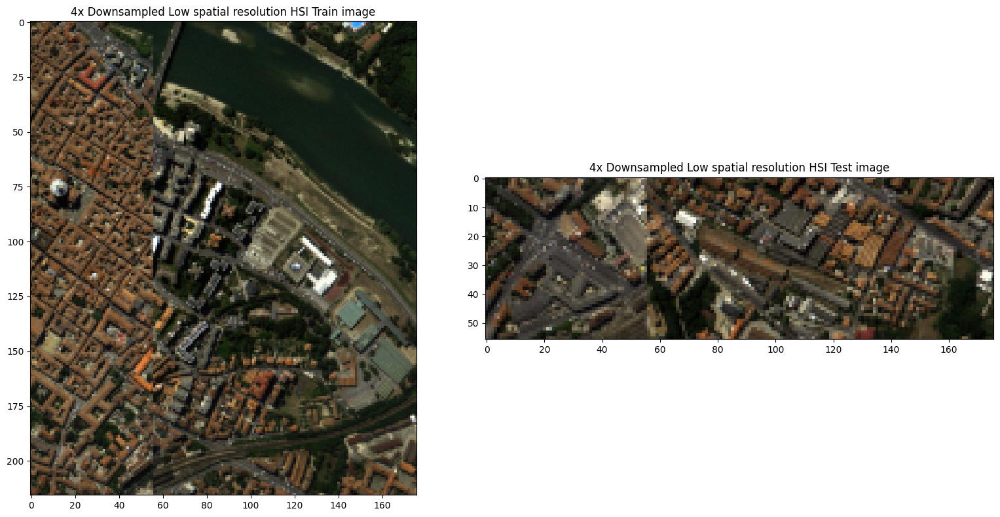

HSI train shape with 8x Downsample:  (108, 88, 102)
HSI test shape with 8x Downsample:  (28, 88, 102)


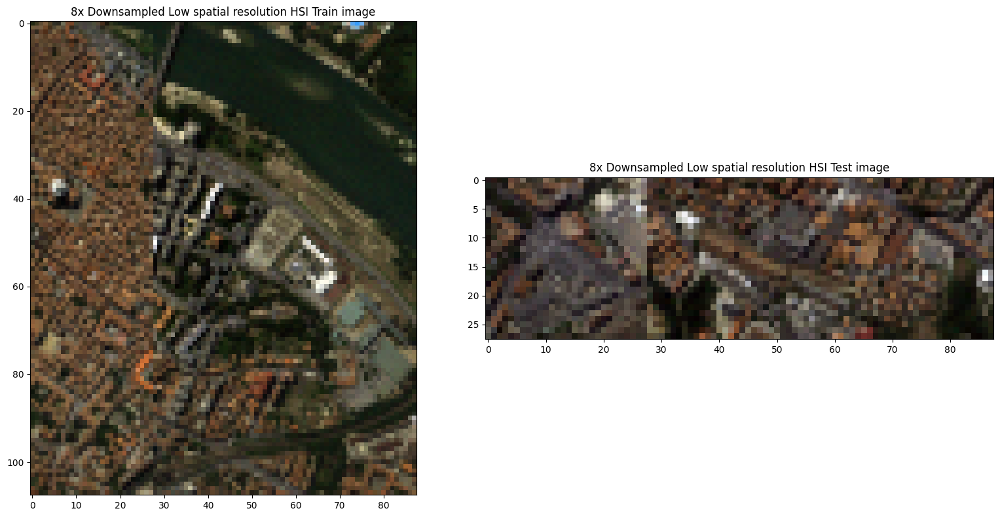

HSI train shape with 16x Downsample:  (54, 44, 102)
HSI test shape with 16x Downsample:  (14, 44, 102)


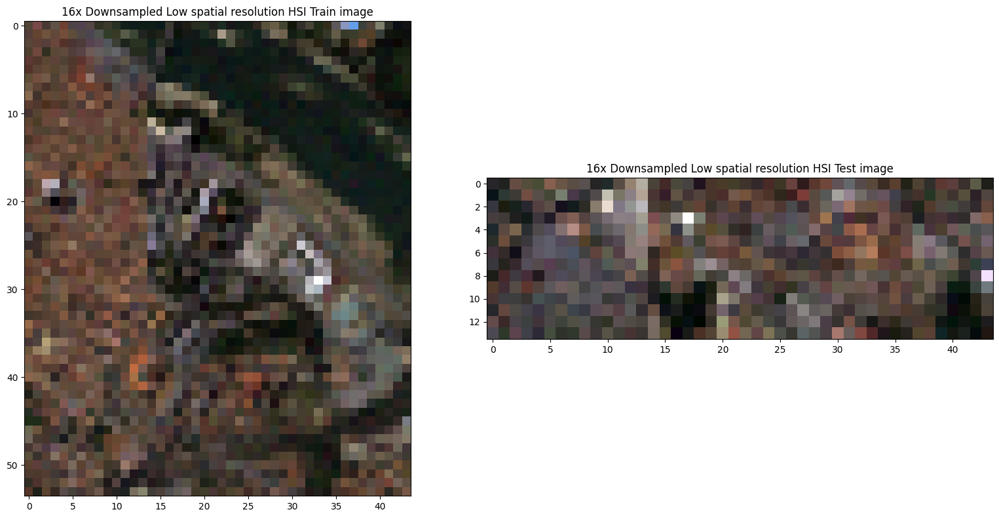

HSI train shape with 32x Downsample:  (27, 22, 102)
HSI test shape with 32x Downsample:  (7, 22, 102)


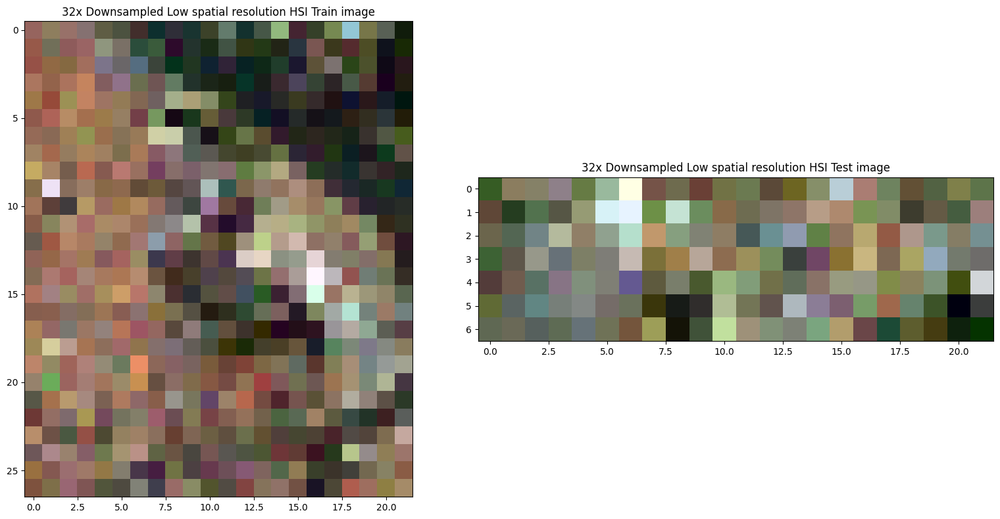

In [13]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_delta = spatial_degradation(pavia_center_image, delta_psf, 4, 35)
I_HS_4_train_delta, I_HS_4_test_delta = split_lr_hsi(I_HS_4_delta, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_delta.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_delta.shape)
visualize_hsi(I_HS_4_train_delta, I_HS_4_test_delta, (50,35,15), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_delta = spatial_degradation(pavia_center_image, delta_psf, 8, 30)
I_HS_8_train_delta, I_HS_8_test_delta = split_lr_hsi(I_HS_8_delta, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_delta.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_delta.shape)
visualize_hsi(I_HS_8_train_delta, I_HS_8_test_delta, (50,35,15), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_delta = spatial_degradation(pavia_center_image, delta_psf, 16, 25)
I_HS_16_train_delta, I_HS_16_test_delta = split_lr_hsi(I_HS_16_delta, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_delta.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_delta.shape)
visualize_hsi(I_HS_16_train_delta, I_HS_16_test_delta, (50,35,15), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_delta = spatial_degradation(pavia_center_image, delta_psf, 32, 20)
I_HS_32_train_delta, I_HS_32_test_delta = split_lr_hsi(I_HS_32_delta, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_delta.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_delta.shape)
visualize_hsi(I_HS_32_train_delta, I_HS_32_test_delta, (50,35,15), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

GuidedNet: A General CNN Fusion Framework via High-Resolution Guidance for Hyperspectral Image Super-Resolution implementation from their GitHub

In [14]:
def get_gpu_memory_mb():
    """Returns current GPU memory usage (in MB) for GPU:0 using TensorFlow."""
    mem_info = tf.config.experimental.get_memory_info('GPU:0')
    return mem_info['current'] / (1024 ** 2)  # bytes → MB

In [15]:
def analyze_model_performance_tf(model, sample_inputs):
    """
    Analyze TensorFlow model performance and print:
    - Number of parameters
    - FLOPs
    - GPU memory consumed (in MB)
    - Inference time (in seconds)

    Parameters:
    -----------
    model : tf.keras.Model
        Your model.

    sample_inputs : list of tf.Tensor
        Input tensors to run inference.
    """

    # --- Infer input_signature from sample_inputs ---
    input_signature = [
        tf.TensorSpec(shape=inp.shape, dtype=inp.dtype) for inp in sample_inputs
    ]

    # --- FLOPs ---
    concrete_func = tf.function(model).get_concrete_function(*input_signature)
    frozen_func = convert_variables_to_constants_v2(concrete_func)
    graph_def = frozen_func.graph.as_graph_def()

    # Suppress stdout temporarily to hide profiler spam
    original_stdout = sys.stdout
    sys.stdout = iot.StringIO()

    try:
        with tf.Graph().as_default() as graph:
            tf.compat.v1.import_graph_def(graph_def, name='')
            run_meta = tf.compat.v1.RunMetadata()
            opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()
            opts['output'] = 'none'

            flops = tf.compat.v1.profiler.profile(
                graph=graph,
                run_meta=run_meta,
                options=opts
            ).total_float_ops
    finally:
        sys.stdout = original_stdout

    # --- Parameters ---
    num_params = np.sum([np.prod(v.shape) for v in model.trainable_variables])
    start_mem = get_gpu_memory_mb()

    # --- Inference Time ---
    start = time.time()
    _ = model(*sample_inputs, training=False)
    end = time.time()
    inference_time_sec = end - start

    # --- GPU Memory consumed at inference---
    end_mem = get_gpu_memory_mb()
    mem_used = end_mem - start_mem

    # --- Print Results ---
    print(f"Number of parameters: {num_params:,}")
    print(f"FLOPs: {flops:,}")
    print(f"GPU Memory:      {mem_used:.2f} MB")
    print(f"Inference time: {inference_time_sec:.4f} seconds")

In [16]:
class Subpixel2D(tf.keras.layers.Layer):
    """
    Subpixel upsampling using tf.nn.depth_to_space.
    Expects last dimension = (channels * (block_size^2)).
    """
    def __init__(self, block_size=2, **kwargs):
        super().__init__(**kwargs)
        self.block_size = block_size

    def call(self, inputs):
        # inputs: (batch, h, w, c * block_size^2)
        return tf.nn.depth_to_space(inputs, self.block_size)


class HyNetSingleLevel(tf.keras.layers.Layer):
    """
    One scale level: upsamples net_feature by 2×, merges with MSI,
    does residual blocks, then upsamples net_image by 2× + gradient correction.
    """
    def __init__(self, hs_bands=31, res_number=10, **kwargs):
        super().__init__(**kwargs)
        self.hs_bands = hs_bands
        self.res_number = res_number

        # Feature upsampling (Conv2DTranspose with stride=2)
        self.deconv_feature = tf.keras.layers.Conv2DTranspose(
            filters=64, kernel_size=6, strides=2, padding='same',
            kernel_initializer=tf.keras.initializers.GlorotUniform()
        )

        # Merge Convs after concat
        self.merge_conv1 = tf.keras.layers.Conv2D(
            filters=64, kernel_size=3, padding='same',
            kernel_initializer=tf.keras.initializers.GlorotUniform()
        )
        self.merge_conv2 = tf.keras.layers.Conv2D(
            filters=64, kernel_size=3, padding='same',
            kernel_initializer=tf.keras.initializers.GlorotUniform()
        )

        # Residual blocks
        self.residual_convs = []
        for _ in range(res_number):
            conv = tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, padding='same',
                kernel_initializer=tf.keras.initializers.GlorotUniform()
            )
            self.residual_convs.append(conv)

        # Gradient conv => produce "hs_bands" channels
        self.gradient_conv = tf.keras.layers.Conv2D(
            filters=self.hs_bands, kernel_size=3, padding='same',
            kernel_initializer=tf.keras.initializers.GlorotUniform()
        )

        # Upsample net_image => use subpixel
        self.upconv_image = tf.keras.layers.Conv2D(
            filters=self.hs_bands * 4,  # subpixel x2 => *4
            kernel_size=3, padding='same',
            kernel_initializer=tf.keras.initializers.GlorotUniform()
        )
        self.subpixel_image = Subpixel2D(block_size=2)

    def call(self, net_image, net_feature, msi_downsample, training=None):
        """
        net_image:   (B, h, w, hs_bands)
        net_feature: (B, h, w, 64)
        msi_downsample: (B, h, w, ???)  # MSI at same scale as net_feature
        """
        # 1) Upsample net_feature by 2×
        net_feature_up = self.deconv_feature(net_feature, training=training)
        # 2) Concatenate with MSI
        concat = tf.concat([net_feature_up, msi_downsample], axis=-1)
        # 3) Merge conv
        x = self.merge_conv1(concat, training=training)
        x = self.merge_conv2(x, training=training)
        # 4) Residual blocks
        for conv in self.residual_convs:
            tmp = tf.nn.leaky_relu(x)
            tmp = conv(tmp, training=training)
            x = x + tmp
        net_feature_out = x

        # 5) Gradient in HSI domain
        gradient_level = self.gradient_conv(x, training=training)

        # 6) Upsample net_image by 2 using subpixel
        net_image_conv = self.upconv_image(net_image, training=training)
        net_image_up = self.subpixel_image(net_image_conv)

        # 7) Add gradient
        net_image_up = net_image_up + gradient_level

        return net_image_up, net_feature_out


class MultiScaleHyNet(tf.keras.Model):
    def __init__(self, hs_bands=31, msi_channels=4, res_number=10, scale_factor=8):
        super().__init__()
        self.num_levels = int(math.log2(scale_factor))

        # Initial convs
        self.init_conv1 = tf.keras.layers.Conv2D(64, 3, padding='same')
        self.init_conv2 = tf.keras.layers.Conv2D(64, 3, padding='same')

        # HyNetSingleLevel blocks
        self.levels = []
        for _ in range(self.num_levels):
            self.levels.append(HyNetSingleLevel(hs_bands=hs_bands, res_number=res_number))

        # Downsamplers
        self.msi_downs = []
        for _ in range(self.num_levels):
            self.msi_downs.append(
                tf.keras.layers.Conv2D(msi_channels, 6, strides=2, padding='same')
            )

    def call(self, lr_hsi, hr_msi, training=None):
        # 1) Feature extraction
        net_feature = self.init_conv1(lr_hsi, training=training)
        net_feature = self.init_conv2(net_feature, training=training)
        net_image   = lr_hsi

        # 2) We store [8×, 4×, 2×, 1×] in msi_scales if scale_factor=8
        msi_scales = [hr_msi]
        temp = hr_msi
        for down in self.msi_downs: 
            temp = down(temp, training=training)
            msi_scales.append(temp)

        # Reverse them so now we have [1×, 2×, 4×, 8×]
        msi_scales.reverse()

        # 3) Now do each level:
        #    First level => up from 1× to 2× => feed the 2× MSI,
        #    second => from 2× to 4× => feed the 4× MSI, etc.
        outputs = []
        for i, level in enumerate(self.levels):
            # i=0 => net_image is 1× => after the block => 2×
            # we want msi_scales[1], which is 2×
            msi_for_level = msi_scales[i+1]
            net_image, net_feature = level(net_image, net_feature, msi_for_level, training=training)
            outputs.append(net_image)

        return outputs

Output file to save super-resolved images

In [17]:
# Get the current working directory
notebook_directory = os.getcwd()

# Define the relative path to the target directory
target_relative_path = "../../../Super_Resolved_Images_From_Comparison_Implementations/GuidedNet"

# Construct the full path to the target directory
target_path = os.path.join(notebook_directory, target_relative_path)

# Normalize the path to remove redundancies
normalized_target_path = os.path.normpath(target_path)

# Define the path to the folder
pavia_center_guidednet_folder_path = os.path.join(normalized_target_path, 'Pavia_Center')

# Create the folder if it doesn't exist
if not os.path.exists(pavia_center_guidednet_folder_path):
    os.makedirs(pavia_center_guidednet_folder_path)

## Super Resolving HSI degraded with Gaussian PSF

In [26]:
# Creating sub folder within which to save the super resolved images from Gaussian PSF degraded HSI
pavia_center_guided_net_gaus_folder_path = os.path.join(pavia_center_guidednet_folder_path, 'Gaussian_PSF')

# Create the Gaussian sub folder if it doesn't exist
if not os.path.exists(pavia_center_guided_net_gaus_folder_path):
    os.makedirs(pavia_center_guided_net_gaus_folder_path)

Running GuidedNet on Pavia Center LR HSI with 4x Downsampling and 4 band MSI

In [27]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_gaus)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_gaus)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gaus_folder_path}/SR_Pavia_Center_gaussian_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net/conv2d_31/kernel', 'multi_scale_hy_net/conv2d_31/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749806374.474046  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749806374.518614  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749806374.523869  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749806374.906082  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749806374.986557  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accura

Training completed in  661.45 seconds
Training complete!


I0000 00:00:1749807028.835448  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.
Number of parameters: 2,150,436
FLOPs: 252,200,295,424
GPU Memory:      76.70 MB
Inference time: 0.0372 seconds
Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gaus_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 4 band MSI

In [28]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gaus)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gaus)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gaus_folder_path}/SR_Pavia_Center_gaussian_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_1/conv2d_78/kernel', 'multi_scale_hy_net_1/conv2d_78/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749807039.625012  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749807039.632066  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749807039.637127  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749807039.641477  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749807039.644534  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement ac

Training completed in  714.27 seconds
Training complete!


I0000 00:00:1749807744.942791  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,177,782
FLOPs: 263,310,589,696
GPU Memory:      80.53 MB
Inference time: 0.0544 seconds
Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gaus_folder_path


Running GuidedNet on Pavia Center LR HSI with 16x Downsampling and 4 band MSI

In [29]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_gaus)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_gaus)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gaus_folder_path}/SR_Pavia_Center_gaussian_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_2/conv2d_140/kernel', 'multi_scale_hy_net_2/conv2d_140/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749807758.998726  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749807759.005139  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749807759.012915  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749807759.018251  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749807759.019998  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  750.30 seconds
Training complete!


I0000 00:00:1749808497.316612  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,205,128
FLOPs: 266,088,163,264
GPU Memory:      82.60 MB
Inference time: 0.0727 seconds
Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gaus_folder_path


Running GuidedNet on Pavia Center LR HSI with 32x Downsampling and 4 band MSI

In [30]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_gaus)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_gaus)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gaus_folder_path}/SR_Pavia_Center_gaussian_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_3/conv2d_217/kernel', 'multi_scale_hy_net_3/conv2d_217/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749808514.402689  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749808514.423380  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749808514.432940  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749808514.437236  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749808514.440243  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  779.52 seconds
Training complete!


I0000 00:00:1749809279.347396  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,232,474
FLOPs: 266,782,556,656
GPU Memory:      147.84 MB
Inference time: 0.0887 seconds
Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gaus_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 1 band Pan image

In [31]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gaus)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gaus)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gaus_folder_path}/SR_Pavia_Center_gaussian_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_4/conv2d_264/kernel', 'multi_scale_hy_net_4/conv2d_264/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749809291.248511  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749809291.267657  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749809291.277946  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749809291.283954  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749809291.290018  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  715.43 seconds
Training complete!


I0000 00:00:1749809997.333945  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,170,969
FLOPs: 262,541,910,400
GPU Memory:      94.09 MB
Inference time: 0.0534 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_gaus_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 3 band RGB image

In [32]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gaus)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gaus)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gaus_folder_path}/SR_Pavia_Center_gaussian_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_5/conv2d_311/kernel', 'multi_scale_hy_net_5/conv2d_311/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749810008.136837  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749810008.144115  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749810008.152450  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749810008.158193  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749810008.164309  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  714.56 seconds
Training complete!


I0000 00:00:1749810713.897079  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,175,295
FLOPs: 263,047,266,944
GPU Memory:      92.10 MB
Inference time: 0.0552 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_gaus_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 8 band MSI

In [33]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gaus)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gaus)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gaus_folder_path}/SR_Pavia_Center_gaussian_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_6/conv2d_358/kernel', 'multi_scale_hy_net_6/conv2d_358/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749810725.864188  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749810725.871802  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749810725.879352  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749810725.885223  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749810725.891603  981920 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  713.94 seconds
Training complete!


I0000 00:00:1749811431.067829  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,189,890
FLOPs: 264,434,843,904
GPU Memory:      85.10 MB
Inference time: 0.0540 seconds
Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_gaus_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 16 band MSI

In [34]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gaus)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gaus)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gaus_folder_path}/SR_Pavia_Center_gaussian_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_7/conv2d_405/kernel', 'multi_scale_hy_net_7/conv2d_405/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749811442.882192  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749811442.890487  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749811442.898085  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749811442.903741  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749811442.909925  981919 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  716.82 seconds
Training complete!


I0000 00:00:1749812150.078568  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,224,474
FLOPs: 267,023,975,680
GPU Memory:      80.53 MB
Inference time: 0.0548 seconds
Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_gaus_folder_path


## Super Resolving HSI degraded with Kolmogorov PSF

In [35]:
# Creating sub folder within which to save the super resolved images from Kolmogorov PSF degraded HSI
pavia_center_guided_net_kol_folder_path = os.path.join(pavia_center_guidednet_folder_path, 'Kolmogorov_PSF')

# Create the Kolmogorov sub folder if it doesn't exist
if not os.path.exists(pavia_center_guided_net_kol_folder_path):
    os.makedirs(pavia_center_guided_net_kol_folder_path)

Running GuidedNet on Pavia Center LR HSI with 4x Downsampling and 4 band MSI

In [36]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_kol)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_kol)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_kol_folder_path}/SR_Pavia_Center_kolmogorov_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_8/conv2d_437/kernel', 'multi_scale_hy_net_8/conv2d_437/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:03<00:00,  7.54it/s, loss=0.047571]


Training completed in  663.01 seconds
Training complete!


I0000 00:00:1749812815.009076  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,150,436
FLOPs: 252,200,295,424
GPU Memory:      76.70 MB
Inference time: 0.0373 seconds
Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_kol_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 4 band MSI

In [37]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_kol)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_kol)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_kol_folder_path}/SR_Pavia_Center_kolmogorov_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_9/conv2d_484/kernel', 'multi_scale_hy_net_9/conv2d_484/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:54<00:00,  7.00it/s, loss=0.151846] 


Training completed in  714.69 seconds
Training complete!


I0000 00:00:1749813531.517066  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,177,782
FLOPs: 263,310,589,696
GPU Memory:      83.84 MB
Inference time: 0.0542 seconds
Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_kol_folder_path


Running GuidedNet on Pavia Center LR HSI with 16x Downsampling and 4 band MSI

In [38]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_kol)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_kol)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_kol_folder_path}/SR_Pavia_Center_kolmogorov_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_10/conv2d_546/kernel', 'multi_scale_hy_net_10/conv2d_546/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:30<00:00,  6.67it/s, loss=0.491650]  


Training completed in  750.17 seconds
Training complete!


I0000 00:00:1749814283.863459  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,205,128
FLOPs: 266,088,163,264
GPU Memory:      98.33 MB
Inference time: 0.0705 seconds
Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_kol_folder_path


Running GuidedNet on Pavia Center LR HSI with 32x Downsampling and 4 band MSI

In [39]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_kol)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_kol)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_kol_folder_path}/SR_Pavia_Center_kolmogorov_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_11/conv2d_623/kernel', 'multi_scale_hy_net_11/conv2d_623/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [13:00<00:00,  6.41it/s, loss=1.113307]   


Training completed in  780.21 seconds
Training complete!


I0000 00:00:1749815066.735254  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,232,474
FLOPs: 266,782,556,656
GPU Memory:      86.41 MB
Inference time: 0.0872 seconds
Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_kol_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 1 band Pan image

In [40]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_kol)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_kol)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_kol_folder_path}/SR_Pavia_Center_kolmogorov_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_12/conv2d_670/kernel', 'multi_scale_hy_net_12/conv2d_670/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:57<00:00,  6.97it/s, loss=0.252134] 


Training completed in  717.09 seconds
Training complete!


I0000 00:00:1749815786.583400  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,170,969
FLOPs: 262,541,910,400
GPU Memory:      85.22 MB
Inference time: 0.0539 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_kol_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 3 band RGB image

In [41]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_kol)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_kol)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_kol_folder_path}/SR_Pavia_Center_kolmogorov_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_13/conv2d_717/kernel', 'multi_scale_hy_net_13/conv2d_717/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:54<00:00,  6.99it/s, loss=0.165718] 


Training completed in  714.89 seconds
Training complete!


I0000 00:00:1749816503.654644  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,175,295
FLOPs: 263,047,266,944
GPU Memory:      85.38 MB
Inference time: 0.0542 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_kol_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 8 band MSI

In [42]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_kol)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_kol)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_kol_folder_path}/SR_Pavia_Center_kolmogorov_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_14/conv2d_764/kernel', 'multi_scale_hy_net_14/conv2d_764/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:55<00:00,  6.99it/s, loss=0.132912] 


Training completed in  715.76 seconds
Training complete!


I0000 00:00:1749817221.673610  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,189,890
FLOPs: 264,434,843,904
GPU Memory:      84.92 MB
Inference time: 0.0546 seconds
Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_kol_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 16 band MSI

In [43]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_kol)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_kol)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_kol_folder_path}/SR_Pavia_Center_kolmogorov_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_15/conv2d_811/kernel', 'multi_scale_hy_net_15/conv2d_811/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:54<00:00,  7.00it/s, loss=0.139068] 


Training completed in  714.68 seconds
Training complete!


I0000 00:00:1749817938.637592  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,224,474
FLOPs: 267,023,975,680
GPU Memory:      95.20 MB
Inference time: 0.0538 seconds
Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_kol_folder_path


## Super Resolving HSI degraded with Airy PSF

In [44]:
# Creating sub folder within which to save the super resolved images from Airy PSF degraded HSI
pavia_center_guided_net_air_folder_path = os.path.join(pavia_center_guidednet_folder_path, 'Airy_PSF')

# Create the Airy sub folder if it doesn't exist
if not os.path.exists(pavia_center_guided_net_air_folder_path):
    os.makedirs(pavia_center_guided_net_air_folder_path)

Running GuidedNet on Pavia Center LR HSI with 4x Downsampling and 4 band MSI

In [45]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_air)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_air)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_air_folder_path}/SR_Pavia_Center_airy_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_16/conv2d_843/kernel', 'multi_scale_hy_net_16/conv2d_843/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:02<00:00,  7.55it/s, loss=0.044525]


Training completed in  662.62 seconds
Training complete!


I0000 00:00:1749818603.168697  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,150,436
FLOPs: 252,200,295,424
GPU Memory:      81.08 MB
Inference time: 0.0377 seconds
Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_air_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 4 band MSI

In [46]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_air)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_air)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_air_folder_path}/SR_Pavia_Center_airy_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_17/conv2d_890/kernel', 'multi_scale_hy_net_17/conv2d_890/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:57<00:00,  6.97it/s, loss=0.147834] 


Training completed in  717.09 seconds
Training complete!


I0000 00:00:1749819322.049094  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,177,782
FLOPs: 263,310,589,696
GPU Memory:      80.53 MB
Inference time: 0.0546 seconds
Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_air_folder_path


Running GuidedNet on Pavia Center LR HSI with 16x Downsampling and 4 band MSI

In [47]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_air)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_air)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_air_folder_path}/SR_Pavia_Center_airy_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_18/conv2d_952/kernel', 'multi_scale_hy_net_18/conv2d_952/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:33<00:00,  6.64it/s, loss=0.456551]  


Training completed in  753.09 seconds
Training complete!


I0000 00:00:1749820077.434100  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,205,128
FLOPs: 266,088,163,264
GPU Memory:      108.67 MB
Inference time: 0.0709 seconds
Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_air_folder_path


Running GuidedNet on Pavia Center LR HSI with 32x Downsampling and 4 band MSI

In [48]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_air)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_air)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_air_folder_path}/SR_Pavia_Center_airy_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_19/conv2d_1029/kernel', 'multi_scale_hy_net_19/conv2d_1029/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [13:01<00:00,  6.40it/s, loss=1.207912]   


Training completed in  781.13 seconds
Training complete!


I0000 00:00:1749820861.449636  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,232,474
FLOPs: 266,782,556,656
GPU Memory:      81.73 MB
Inference time: 0.0890 seconds
Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_air_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 1 band Pan image

In [49]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_air)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_air)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_air_folder_path}/SR_Pavia_Center_airy_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_20/conv2d_1076/kernel', 'multi_scale_hy_net_20/conv2d_1076/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:54<00:00,  7.00it/s, loss=0.270766] 


Training completed in  714.60 seconds
Training complete!


I0000 00:00:1749821578.700649  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,170,969
FLOPs: 262,541,910,400
GPU Memory:      87.56 MB
Inference time: 0.0540 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_air_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 3 band RGB image

In [50]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_air)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_air)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_air_folder_path}/SR_Pavia_Center_airy_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_21/conv2d_1123/kernel', 'multi_scale_hy_net_21/conv2d_1123/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:58<00:00,  6.95it/s, loss=0.161126] 


Training completed in  718.99 seconds
Training complete!


I0000 00:00:1749822299.885491  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,175,295
FLOPs: 263,047,266,944
GPU Memory:      125.39 MB
Inference time: 0.0541 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_air_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 8 band MSI

In [51]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_air)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_air)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_air_folder_path}/SR_Pavia_Center_airy_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_22/conv2d_1170/kernel', 'multi_scale_hy_net_22/conv2d_1170/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:54<00:00,  7.00it/s, loss=0.152795] 


Training completed in  714.49 seconds
Training complete!


I0000 00:00:1749823016.471206  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,189,890
FLOPs: 264,434,843,904
GPU Memory:      80.53 MB
Inference time: 0.0539 seconds
Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_air_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 16 band MSI

In [52]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_air)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_air)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_air_folder_path}/SR_Pavia_Center_airy_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_23/conv2d_1217/kernel', 'multi_scale_hy_net_23/conv2d_1217/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:55<00:00,  6.99it/s, loss=0.134039] 


Training completed in  715.29 seconds
Training complete!


I0000 00:00:1749823733.860191  980722 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,224,474
FLOPs: 267,023,975,680
GPU Memory:      83.70 MB
Inference time: 0.0544 seconds
Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_air_folder_path


## Super Resolving HSI degraded with Moffat PSF

In [23]:
# Creating sub folder within which to save the super resolved images from Moffat PSF degraded HSI
pavia_center_guided_net_mof_folder_path = os.path.join(pavia_center_guidednet_folder_path, 'Moffat_PSF')

# Create the Moffat sub folder if it doesn't exist
if not os.path.exists(pavia_center_guided_net_mof_folder_path):
    os.makedirs(pavia_center_guided_net_mof_folder_path)

Running GuidedNet on Pavia Center LR HSI with 4x Downsampling and 4 band MSI

In [24]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_mof)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_mof)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_mof_folder_path}/SR_Pavia_Center_moffat_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net/conv2d_31/kernel', 'multi_scale_hy_net/conv2d_31/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749905555.057216 1140601 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749905555.102473 1140601 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749905555.106754 1140601 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749905555.488104 1140601 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749905555.599581 1140601 gpu_timer.cc:114] Skipping the delay kernel, measurement accura

Training completed in  664.91 seconds
Training complete!


I0000 00:00:1749906212.860883 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.
Number of parameters: 2,150,436
FLOPs: 252,200,295,424
GPU Memory:      76.70 MB
Inference time: 0.0376 seconds
Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_mof_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 4 band MSI

In [25]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_mof)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_mof)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_mof_folder_path}/SR_Pavia_Center_moffat_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_1/conv2d_78/kernel', 'multi_scale_hy_net_1/conv2d_78/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749906223.696549 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749906223.702540 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749906223.708708 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749906223.711441 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749906223.714784 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement ac

Training completed in  720.33 seconds
Training complete!


I0000 00:00:1749906935.273668 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,177,782
FLOPs: 263,310,589,696
GPU Memory:      82.85 MB
Inference time: 0.0574 seconds
Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_mof_folder_path


Running GuidedNet on Pavia Center LR HSI with 16x Downsampling and 4 band MSI

In [26]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_mof)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_mof)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_mof_folder_path}/SR_Pavia_Center_moffat_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_2/conv2d_140/kernel', 'multi_scale_hy_net_2/conv2d_140/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749906949.223442 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749906949.228495 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749906949.236693 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749906949.242529 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749906949.244712 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  757.96 seconds
Training complete!


I0000 00:00:1749907695.337597 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,205,128
FLOPs: 266,088,163,264
GPU Memory:      84.83 MB
Inference time: 0.0718 seconds
Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_mof_folder_path


Running GuidedNet on Pavia Center LR HSI with 32x Downsampling and 4 band MSI

In [27]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_mof)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_mof)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_mof_folder_path}/SR_Pavia_Center_moffat_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_3/conv2d_217/kernel', 'multi_scale_hy_net_3/conv2d_217/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749907712.145538 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749907712.166500 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749907712.178968 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749907712.183542 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749907712.186296 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  789.93 seconds
Training complete!


I0000 00:00:1749908487.812639 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,232,474
FLOPs: 266,782,556,656
GPU Memory:      84.19 MB
Inference time: 0.0956 seconds
Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_mof_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 1 band Pan image

In [28]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_mof)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_mof)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_mof_folder_path}/SR_Pavia_Center_moffat_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_4/conv2d_264/kernel', 'multi_scale_hy_net_4/conv2d_264/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749908499.609532 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749908499.629783 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749908499.639465 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749908499.645626 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749908499.651889 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  720.04 seconds
Training complete!


I0000 00:00:1749909210.435608 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,170,969
FLOPs: 262,541,910,400
GPU Memory:      90.79 MB
Inference time: 0.0584 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_mof_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 3 band RGB image

In [29]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_mof)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_mof)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_mof_folder_path}/SR_Pavia_Center_moffat_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_5/conv2d_311/kernel', 'multi_scale_hy_net_5/conv2d_311/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749909222.072666 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749909222.080600 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749909222.087914 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749909222.093605 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749909222.099554 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  720.69 seconds
Training complete!


I0000 00:00:1749909933.173101 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,175,295
FLOPs: 263,047,266,944
GPU Memory:      80.53 MB
Inference time: 0.0544 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_mof_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 8 band MSI

In [30]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_mof)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_mof)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_mof_folder_path}/SR_Pavia_Center_moffat_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_6/conv2d_358/kernel', 'multi_scale_hy_net_6/conv2d_358/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749909944.180754 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749909944.187620 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749909944.195085 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749909944.200748 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749909944.206839 1140602 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  718.84 seconds
Training complete!


I0000 00:00:1749910654.048119 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,189,890
FLOPs: 264,434,843,904
GPU Memory:      82.95 MB
Inference time: 0.0542 seconds
Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_mof_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 16 band MSI

In [31]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_mof)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_mof)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_mof_folder_path}/SR_Pavia_Center_moffat_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_7/conv2d_405/kernel', 'multi_scale_hy_net_7/conv2d_405/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749910665.792472 1140601 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749910665.800682 1140601 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749910665.807543 1140601 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749910665.813094 1140601 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749910665.819242 1140601 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  720.71 seconds
Training complete!


I0000 00:00:1749911376.779062 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,224,474
FLOPs: 267,023,975,680
GPU Memory:      80.53 MB
Inference time: 0.0588 seconds
Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_mof_folder_path


## Super Resolving HSI degraded with Sinc PSF

In [32]:
# Creating sub folder within which to save the super resolved images from Sinc PSF degraded HSI
pavia_center_guided_net_sinc_folder_path = os.path.join(pavia_center_guidednet_folder_path, 'Sinc_PSF')

# Create the Sinc sub folder if it doesn't exist
if not os.path.exists(pavia_center_guided_net_sinc_folder_path):
    os.makedirs(pavia_center_guided_net_sinc_folder_path)

Running GuidedNet on Pavia Center LR HSI with 4x Downsampling and 4 band MSI

In [33]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_sinc)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_sinc)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_sinc_folder_path}/SR_Pavia_Center_sinc_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_8/conv2d_437/kernel', 'multi_scale_hy_net_8/conv2d_437/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:07<00:00,  7.50it/s, loss=0.046979]


Training completed in  667.09 seconds
Training complete!


I0000 00:00:1749912045.854189 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,150,436
FLOPs: 252,200,295,424
GPU Memory:      76.70 MB
Inference time: 0.0375 seconds
Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_sinc_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 4 band MSI

In [34]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_sinc)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_sinc)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_sinc_folder_path}/SR_Pavia_Center_sinc_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_9/conv2d_484/kernel', 'multi_scale_hy_net_9/conv2d_484/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:57<00:00,  6.97it/s, loss=0.154188] 


Training completed in  717.68 seconds
Training complete!


I0000 00:00:1749912765.956820 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,177,782
FLOPs: 263,310,589,696
GPU Memory:      136.80 MB
Inference time: 0.0544 seconds
Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_sinc_folder_path


Running GuidedNet on Pavia Center LR HSI with 16x Downsampling and 4 band MSI

In [35]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_sinc)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_sinc)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_sinc_folder_path}/SR_Pavia_Center_sinc_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_10/conv2d_546/kernel', 'multi_scale_hy_net_10/conv2d_546/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:40<00:00,  6.57it/s, loss=0.490787]  


Training completed in  760.87 seconds
Training complete!


I0000 00:00:1749913529.426605 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,205,128
FLOPs: 266,088,163,264
GPU Memory:      98.39 MB
Inference time: 0.0741 seconds
Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_sinc_folder_path


Running GuidedNet on Pavia Center LR HSI with 32x Downsampling and 4 band MSI

In [36]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_sinc)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_sinc)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_sinc_folder_path}/SR_Pavia_Center_sinc_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_11/conv2d_623/kernel', 'multi_scale_hy_net_11/conv2d_623/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [13:13<00:00,  6.30it/s, loss=1.117683]   


Training completed in  793.53 seconds
Training complete!


I0000 00:00:1749914326.147071 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,232,474
FLOPs: 266,782,556,656
GPU Memory:      99.50 MB
Inference time: 0.0895 seconds
Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_sinc_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 1 band Pan image

In [37]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_sinc)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_sinc)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_sinc_folder_path}/SR_Pavia_Center_sinc_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_12/conv2d_670/kernel', 'multi_scale_hy_net_12/conv2d_670/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:02<00:00,  6.92it/s, loss=0.251602] 


Training completed in  722.35 seconds
Training complete!


I0000 00:00:1749915051.209279 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,170,969
FLOPs: 262,541,910,400
GPU Memory:      104.62 MB
Inference time: 0.0598 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_sinc_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 3 band RGB image

In [38]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_sinc)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_sinc)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_sinc_folder_path}/SR_Pavia_Center_sinc_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_13/conv2d_717/kernel', 'multi_scale_hy_net_13/conv2d_717/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:02<00:00,  6.92it/s, loss=0.169957] 


Training completed in  722.83 seconds
Training complete!


I0000 00:00:1749915776.232621 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,175,295
FLOPs: 263,047,266,944
GPU Memory:      96.17 MB
Inference time: 0.0609 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_sinc_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 8 band MSI

In [39]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_sinc)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_sinc)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_sinc_folder_path}/SR_Pavia_Center_sinc_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_14/conv2d_764/kernel', 'multi_scale_hy_net_14/conv2d_764/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:59<00:00,  6.95it/s, loss=0.133704] 


Training completed in  719.40 seconds
Training complete!


I0000 00:00:1749916497.939926 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,189,890
FLOPs: 264,434,843,904
GPU Memory:      95.68 MB
Inference time: 0.0605 seconds
Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_sinc_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 16 band MSI

In [40]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_sinc)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_sinc)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_sinc_folder_path}/SR_Pavia_Center_sinc_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_15/conv2d_811/kernel', 'multi_scale_hy_net_15/conv2d_811/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:01<00:00,  6.93it/s, loss=0.138823] 


Training completed in  721.73 seconds
Training complete!


I0000 00:00:1749917221.976775 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,224,474
FLOPs: 267,023,975,680
GPU Memory:      84.13 MB
Inference time: 0.0571 seconds
Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_sinc_folder_path


## Super Resolving HSI degraded with Lorentzian Squared PSF

In [41]:
# Creating sub folder within which to save the super resolved images from Lorentzian Squared PSF degraded HSI
pavia_center_guided_net_lor_sq_folder_path = os.path.join(pavia_center_guidednet_folder_path, 'Lorentzian_Squared_PSF')

# Create the Lorentzian Squared sub folder if it doesn't exist
if not os.path.exists(pavia_center_guided_net_lor_sq_folder_path):
    os.makedirs(pavia_center_guided_net_lor_sq_folder_path)

Running GuidedNet on Pavia Center LR HSI with 4x Downsampling and 4 band MSI

In [42]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_lor_sq_folder_path}/SR_Pavia_Center_lorentzian_squared_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_16/conv2d_843/kernel', 'multi_scale_hy_net_16/conv2d_843/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:05<00:00,  7.51it/s, loss=0.044849]


Training completed in  665.63 seconds
Training complete!


I0000 00:00:1749917889.966042 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,150,436
FLOPs: 252,200,295,424
GPU Memory:      85.09 MB
Inference time: 0.0411 seconds
Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 4 band MSI

In [43]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_lor_sq_folder_path}/SR_Pavia_Center_lorentzian_squared_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_17/conv2d_890/kernel', 'multi_scale_hy_net_17/conv2d_890/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:03<00:00,  6.91it/s, loss=0.144628] 


Training completed in  723.91 seconds
Training complete!


I0000 00:00:1749918615.733981 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,177,782
FLOPs: 263,310,589,696
GPU Memory:      80.53 MB
Inference time: 0.0557 seconds
Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path


Running GuidedNet on Pavia Center LR HSI with 16x Downsampling and 4 band MSI

In [44]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_lor_sq_folder_path}/SR_Pavia_Center_lorentzian_squared_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_18/conv2d_952/kernel', 'multi_scale_hy_net_18/conv2d_952/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:38<00:00,  6.59it/s, loss=0.454659]  


Training completed in  758.58 seconds
Training complete!


I0000 00:00:1749919376.438981 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,205,128
FLOPs: 266,088,163,264
GPU Memory:      107.59 MB
Inference time: 0.0781 seconds
Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path


Running GuidedNet on Pavia Center LR HSI with 32x Downsampling and 4 band MSI

In [45]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_lor_sq_folder_path}/SR_Pavia_Center_lorentzian_squared_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_19/conv2d_1029/kernel', 'multi_scale_hy_net_19/conv2d_1029/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [13:13<00:00,  6.30it/s, loss=1.208472]   


Training completed in  793.65 seconds
Training complete!


I0000 00:00:1749920172.642331 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,232,474
FLOPs: 266,782,556,656
GPU Memory:      94.38 MB
Inference time: 0.0917 seconds
Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 1 band Pan image

In [46]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_lor_sq_folder_path}/SR_Pavia_Center_lorentzian_squared_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_20/conv2d_1076/kernel', 'multi_scale_hy_net_20/conv2d_1076/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:04<00:00,  6.90it/s, loss=0.271491] 


Training completed in  724.90 seconds
Training complete!


I0000 00:00:1749920900.174737 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,170,969
FLOPs: 262,541,910,400
GPU Memory:      84.14 MB
Inference time: 0.0591 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_lor_sq_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 3 band RGB image

In [47]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_lor_sq_folder_path}/SR_Pavia_Center_lorentzian_squared_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_21/conv2d_1123/kernel', 'multi_scale_hy_net_21/conv2d_1123/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:01<00:00,  6.93it/s, loss=0.160019] 


Training completed in  721.83 seconds
Training complete!


I0000 00:00:1749921624.079965 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,175,295
FLOPs: 263,047,266,944
GPU Memory:      82.49 MB
Inference time: 0.0596 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_lor_sq_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 8 band MSI

In [48]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_lor_sq_folder_path}/SR_Pavia_Center_lorentzian_squared_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_22/conv2d_1170/kernel', 'multi_scale_hy_net_22/conv2d_1170/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:59<00:00,  6.95it/s, loss=0.153171] 


Training completed in  719.60 seconds
Training complete!


I0000 00:00:1749922345.739422 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,189,890
FLOPs: 264,434,843,904
GPU Memory:      90.59 MB
Inference time: 0.0587 seconds
Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 16 band MSI

In [49]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_lor_sq_folder_path}/SR_Pavia_Center_lorentzian_squared_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_23/conv2d_1217/kernel', 'multi_scale_hy_net_23/conv2d_1217/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:01<00:00,  6.93it/s, loss=0.131999] 


Training completed in  721.39 seconds
Training complete!


I0000 00:00:1749923069.156702 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,224,474
FLOPs: 267,023,975,680
GPU Memory:      91.30 MB
Inference time: 0.0590 seconds
Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_lor_sq_folder_path


## Super Resolving HSI degraded with Hermite PSF

In [50]:
# Creating sub folder within which to save the super resolved images from Hermite PSF degraded HSI
pavia_center_guided_net_her_folder_path = os.path.join(pavia_center_guidednet_folder_path, 'Hermite_PSF')

# Create the Hermite sub folder if it doesn't exist
if not os.path.exists(pavia_center_guided_net_her_folder_path):
    os.makedirs(pavia_center_guided_net_her_folder_path)

Running GuidedNet on Pavia Center LR HSI with 4x Downsampling and 4 band MSI

In [51]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_her)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_her)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_her_folder_path}/SR_Pavia_Center_hermite_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_24/conv2d_1249/kernel', 'multi_scale_hy_net_24/conv2d_1249/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:05<00:00,  7.51it/s, loss=0.045649]


Training completed in  665.36 seconds
Training complete!


I0000 00:00:1749923736.488261 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,150,436
FLOPs: 252,200,295,424
GPU Memory:      76.70 MB
Inference time: 0.0375 seconds
Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_her_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 4 band MSI

In [52]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_her)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_her)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_her_folder_path}/SR_Pavia_Center_hermite_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_25/conv2d_1296/kernel', 'multi_scale_hy_net_25/conv2d_1296/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:03<00:00,  6.91it/s, loss=0.155363] 


Training completed in  723.17 seconds
Training complete!


I0000 00:00:1749924461.464213 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,177,782
FLOPs: 263,310,589,696
GPU Memory:      86.98 MB
Inference time: 0.0588 seconds
Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_her_folder_path


Running GuidedNet on Pavia Center LR HSI with 16x Downsampling and 4 band MSI

In [53]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_her)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_her)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_her_folder_path}/SR_Pavia_Center_hermite_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_26/conv2d_1358/kernel', 'multi_scale_hy_net_26/conv2d_1358/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:37<00:00,  6.60it/s, loss=0.508043]  


Training completed in  757.68 seconds
Training complete!


I0000 00:00:1749925221.354450 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,205,128
FLOPs: 266,088,163,264
GPU Memory:      101.83 MB
Inference time: 0.0837 seconds
Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_her_folder_path


Running GuidedNet on Pavia Center LR HSI with 32x Downsampling and 4 band MSI

In [54]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_her)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_her)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_her_folder_path}/SR_Pavia_Center_hermite_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_27/conv2d_1435/kernel', 'multi_scale_hy_net_27/conv2d_1435/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [13:08<00:00,  6.34it/s, loss=1.183147]   


Training completed in  788.72 seconds
Training complete!


I0000 00:00:1749926012.609476 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,232,474
FLOPs: 266,782,556,656
GPU Memory:      90.56 MB
Inference time: 0.0884 seconds
Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_her_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 1 band Pan image

In [55]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_her)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_her)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_her_folder_path}/SR_Pavia_Center_hermite_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_28/conv2d_1482/kernel', 'multi_scale_hy_net_28/conv2d_1482/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:01<00:00,  6.93it/s, loss=0.284979]  


Training completed in  721.06 seconds
Training complete!


I0000 00:00:1749926736.245761 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,170,969
FLOPs: 262,541,910,400
GPU Memory:      93.04 MB
Inference time: 0.0542 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_her_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 3 band RGB image

In [56]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_her)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_her)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_her_folder_path}/SR_Pavia_Center_hermite_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_29/conv2d_1529/kernel', 'multi_scale_hy_net_29/conv2d_1529/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:04<00:00,  6.91it/s, loss=0.173013] 


Training completed in  724.11 seconds
Training complete!


I0000 00:00:1749927462.415008 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,175,295
FLOPs: 263,047,266,944
GPU Memory:      104.54 MB
Inference time: 0.0550 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_her_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 8 band MSI

In [57]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_her)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_her)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_her_folder_path}/SR_Pavia_Center_hermite_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_30/conv2d_1576/kernel', 'multi_scale_hy_net_30/conv2d_1576/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:59<00:00,  6.95it/s, loss=0.149010] 


Training completed in  719.51 seconds
Training complete!


I0000 00:00:1749928184.000515 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,189,890
FLOPs: 264,434,843,904
GPU Memory:      114.71 MB
Inference time: 0.0587 seconds
Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_her_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 16 band MSI

In [58]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_her)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_her)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_her_folder_path}/SR_Pavia_Center_hermite_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_31/conv2d_1623/kernel', 'multi_scale_hy_net_31/conv2d_1623/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:00<00:00,  6.94it/s, loss=0.127488] 


Training completed in  720.96 seconds
Training complete!


I0000 00:00:1749928907.020351 1139687 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,224,474
FLOPs: 267,023,975,680
GPU Memory:      81.33 MB
Inference time: 0.0588 seconds
Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_her_folder_path


## Super Resolving HSI degraded with Parabolic PSF

In [19]:
# Creating sub folder within which to save the super resolved images from Parabolic PSF degraded HSI
pavia_center_guided_net_par_folder_path = os.path.join(pavia_center_guidednet_folder_path, 'Parabolic_PSF')

# Create the Parabolic sub folder if it doesn't exist
if not os.path.exists(pavia_center_guided_net_par_folder_path):
    os.makedirs(pavia_center_guided_net_par_folder_path)

Running GuidedNet on Pavia Center LR HSI with 4x Downsampling and 4 band MSI

In [20]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_par)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_par)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_par_folder_path}/SR_Pavia_Center_parabolic_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net/conv2d_31/kernel', 'multi_scale_hy_net/conv2d_31/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749929673.992735  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749929674.038498  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749929674.043184  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749929674.409147  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749929674.496011  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accura

Training completed in  657.60 seconds
Training complete!


I0000 00:00:1749930324.585243  782871 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.
Number of parameters: 2,150,436
FLOPs: 252,200,295,424
GPU Memory:      85.12 MB
Inference time: 0.0377 seconds
Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_par_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 4 band MSI

In [21]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_par)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_par)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_par_folder_path}/SR_Pavia_Center_parabolic_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_1/conv2d_78/kernel', 'multi_scale_hy_net_1/conv2d_78/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749930335.239443  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749930335.245344  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749930335.250588  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749930335.254059  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749930335.257417  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement ac

Training completed in  707.34 seconds
Training complete!


I0000 00:00:1749931033.771977  782871 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,177,782
FLOPs: 263,310,589,696
GPU Memory:      80.53 MB
Inference time: 0.0544 seconds
Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_par_folder_path


Running GuidedNet on Pavia Center LR HSI with 16x Downsampling and 4 band MSI

In [22]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_par)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_par)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_par_folder_path}/SR_Pavia_Center_parabolic_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_2/conv2d_140/kernel', 'multi_scale_hy_net_2/conv2d_140/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749931047.689135  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749931047.695386  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749931047.702003  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749931047.705793  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749931047.707472  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  739.60 seconds
Training complete!


I0000 00:00:1749931775.835139  782871 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,205,128
FLOPs: 266,088,163,264
GPU Memory:      90.26 MB
Inference time: 0.0718 seconds
Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_par_folder_path


Running GuidedNet on Pavia Center LR HSI with 32x Downsampling and 4 band MSI

In [23]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_par)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_par)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_par_folder_path}/SR_Pavia_Center_parabolic_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_3/conv2d_217/kernel', 'multi_scale_hy_net_3/conv2d_217/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749931792.593350  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749931792.614096  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749931792.623372  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749931792.627515  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749931792.630318  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  770.62 seconds
Training complete!


I0000 00:00:1749932549.022508  782871 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,232,474
FLOPs: 266,782,556,656
GPU Memory:      81.73 MB
Inference time: 0.0876 seconds
Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_par_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 1 band Pan image

In [24]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_par)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_par)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_par_folder_path}/SR_Pavia_Center_parabolic_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_4/conv2d_264/kernel', 'multi_scale_hy_net_4/conv2d_264/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749932560.848623  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749932560.864540  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749932560.873085  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749932560.879044  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749932560.884975  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  709.33 seconds
Training complete!


I0000 00:00:1749933260.959192  782871 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,170,969
FLOPs: 262,541,910,400
GPU Memory:      95.44 MB
Inference time: 0.0542 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_par_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 3 band RGB image

In [25]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_par)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_par)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_par_folder_path}/SR_Pavia_Center_parabolic_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_5/conv2d_311/kernel', 'multi_scale_hy_net_5/conv2d_311/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749933272.185966  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749933272.192802  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749933272.200261  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749933272.205870  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749933272.211756  783148 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  709.69 seconds
Training complete!


I0000 00:00:1749933972.638586  782871 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,175,295
FLOPs: 263,047,266,944
GPU Memory:      129.91 MB
Inference time: 0.0549 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_par_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 8 band MSI

In [26]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_par)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_par)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_par_folder_path}/SR_Pavia_Center_parabolic_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_6/conv2d_358/kernel', 'multi_scale_hy_net_6/conv2d_358/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749933983.252461  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749933983.260711  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749933983.267600  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749933983.273238  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749933983.279306  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  708.16 seconds
Training complete!


I0000 00:00:1749934682.801778  782871 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,189,890
FLOPs: 264,434,843,904
GPU Memory:      83.53 MB
Inference time: 0.0542 seconds
Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_par_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 16 band MSI

In [27]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_par)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_par)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_par_folder_path}/SR_Pavia_Center_parabolic_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_7/conv2d_405/kernel', 'multi_scale_hy_net_7/conv2d_405/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749934694.376521  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749934694.384319  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749934694.392031  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749934694.397585  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749934694.403614  783147 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  709.94 seconds
Training complete!


I0000 00:00:1749935394.740233  782871 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,224,474
FLOPs: 267,023,975,680
GPU Memory:      143.67 MB
Inference time: 0.0548 seconds
Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_par_folder_path


## Super Resolving HSI degraded with Gabor PSF

In [18]:
# Creating sub folder within which to save the super resolved images from Gabor PSF degraded HSI
pavia_center_guided_net_gab_folder_path = os.path.join(pavia_center_guidednet_folder_path, 'Gabor_PSF')

# Create the Gabor sub folder if it doesn't exist
if not os.path.exists(pavia_center_guided_net_gab_folder_path):
    os.makedirs(pavia_center_guided_net_gab_folder_path)

Running GuidedNet on Pavia Center LR HSI with 4x Downsampling and 4 band MSI

In [19]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_gab)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_gab)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gab_folder_path}/SR_Pavia_Center_gabor_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net/conv2d_31/kernel', 'multi_scale_hy_net/conv2d_31/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749973425.485809  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749973425.534426  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749973425.538552  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749973426.067597  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749973426.158453  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accura

Training completed in  668.18 seconds
Training complete!


I0000 00:00:1749974086.503951  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.
Number of parameters: 2,150,436
FLOPs: 252,200,295,424
GPU Memory:      76.70 MB
Inference time: 0.0378 seconds
Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gab_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 4 band MSI

In [20]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gab)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gab)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gab_folder_path}/SR_Pavia_Center_gabor_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_1/conv2d_78/kernel', 'multi_scale_hy_net_1/conv2d_78/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749974097.189120  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749974097.194896  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749974097.200641  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749974097.203303  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749974097.206554  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement ac

Training completed in  715.36 seconds
Training complete!


I0000 00:00:1749974803.691538  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,177,782
FLOPs: 263,310,589,696
GPU Memory:      83.72 MB
Inference time: 0.0568 seconds
Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gab_folder_path


Running GuidedNet on Pavia Center LR HSI with 16x Downsampling and 4 band MSI

In [21]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_gab)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_gab)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gab_folder_path}/SR_Pavia_Center_gabor_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_2/conv2d_140/kernel', 'multi_scale_hy_net_2/conv2d_140/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749974817.542449  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749974817.548889  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749974817.556540  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749974817.559976  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749974817.561638  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  750.17 seconds
Training complete!


I0000 00:00:1749975555.979624  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,205,128
FLOPs: 266,088,163,264
GPU Memory:      81.49 MB
Inference time: 0.0738 seconds
Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gab_folder_path


Running GuidedNet on Pavia Center LR HSI with 32x Downsampling and 4 band MSI

In [22]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_gab)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_gab)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gab_folder_path}/SR_Pavia_Center_gabor_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_3/conv2d_217/kernel', 'multi_scale_hy_net_3/conv2d_217/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749975573.310010  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749975573.316051  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749975573.340168  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749975573.344706  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749975573.347728  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  783.36 seconds
Training complete!


I0000 00:00:1749976341.915360  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,232,474
FLOPs: 266,782,556,656
GPU Memory:      81.73 MB
Inference time: 0.0902 seconds
Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_gab_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 1 band Pan image

In [23]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gab)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gab)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gab_folder_path}/SR_Pavia_Center_gabor_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_4/conv2d_264/kernel', 'multi_scale_hy_net_4/conv2d_264/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749976353.948143  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749976353.968906  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749976353.977715  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749976353.983713  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749976353.989917  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  718.85 seconds
Training complete!


I0000 00:00:1749977063.334343  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,170,969
FLOPs: 262,541,910,400
GPU Memory:      133.13 MB
Inference time: 0.0552 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_gab_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 3 band RGB image

In [24]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gab)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gab)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gab_folder_path}/SR_Pavia_Center_gabor_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_5/conv2d_311/kernel', 'multi_scale_hy_net_5/conv2d_311/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749977074.367374  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749977074.375084  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749977074.382822  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749977074.388572  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749977074.394975  794564 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  719.19 seconds
Training complete!


I0000 00:00:1749977784.604134  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,175,295
FLOPs: 263,047,266,944
GPU Memory:      92.48 MB
Inference time: 0.7548 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_gab_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 8 band MSI

In [25]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gab)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gab)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gab_folder_path}/SR_Pavia_Center_gabor_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_6/conv2d_358/kernel', 'multi_scale_hy_net_6/conv2d_358/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749977796.204315  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749977796.211948  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749977796.219913  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749977796.225664  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749977796.231784  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  716.54 seconds
Training complete!


I0000 00:00:1749978503.857220  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,189,890
FLOPs: 264,434,843,904
GPU Memory:      80.53 MB
Inference time: 0.0550 seconds
Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_gab_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 16 band MSI

In [26]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gab)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gab)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_gab_folder_path}/SR_Pavia_Center_gabor_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_7/conv2d_405/kernel', 'multi_scale_hy_net_7/conv2d_405/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749978515.691596  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749978515.699948  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749978515.706803  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749978515.712838  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749978515.719403  794563 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  719.03 seconds
Training complete!


I0000 00:00:1749979224.927671  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,224,474
FLOPs: 267,023,975,680
GPU Memory:      82.15 MB
Inference time: 0.0562 seconds
Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_gab_folder_path


## Super Resolving HSI degraded with Delta PSF

In [27]:
# Creating sub folder within which to save the super resolved images from Gabor PSF degraded HSI
pavia_center_guided_net_delta_folder_path = os.path.join(pavia_center_guidednet_folder_path, 'Delta_PSF')

# Create the Gabor sub folder if it doesn't exist
if not os.path.exists(pavia_center_guided_net_delta_folder_path):
    os.makedirs(pavia_center_guided_net_delta_folder_path)

Running GuidedNet on Pavia Center LR HSI with 4x Downsampling and 4 band MSI

In [28]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_delta)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_delta)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_delta_folder_path}/SR_Pavia_Center_delta_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_8/conv2d_437/kernel', 'multi_scale_hy_net_8/conv2d_437/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:07<00:00,  7.49it/s, loss=0.047358]


Training completed in  667.70 seconds
Training complete!


I0000 00:00:1749979894.556939  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,150,436
FLOPs: 252,200,295,424
GPU Memory:      76.70 MB
Inference time: 0.0383 seconds
Saved 4x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_delta_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 4 band MSI

In [29]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_delta)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_delta)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_delta_folder_path}/SR_Pavia_Center_delta_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_9/conv2d_484/kernel', 'multi_scale_hy_net_9/conv2d_484/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:58<00:00,  6.96it/s, loss=0.153416] 


Training completed in  718.34 seconds
Training complete!


I0000 00:00:1749980614.688153  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,177,782
FLOPs: 263,310,589,696
GPU Memory:      80.53 MB
Inference time: 0.0549 seconds
Saved 8x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_delta_folder_path


Running GuidedNet on Pavia Center LR HSI with 16x Downsampling and 4 band MSI

In [30]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_delta)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_delta)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_delta_folder_path}/SR_Pavia_Center_delta_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_10/conv2d_546/kernel', 'multi_scale_hy_net_10/conv2d_546/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [12:31<00:00,  6.65it/s, loss=0.492024]  


Training completed in  751.74 seconds
Training complete!


I0000 00:00:1749981368.498478  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,205,128
FLOPs: 266,088,163,264
GPU Memory:      90.07 MB
Inference time: 0.0728 seconds
Saved 16x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_delta_folder_path


Running GuidedNet on Pavia Center LR HSI with 32x Downsampling and 4 band MSI

In [31]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_delta)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_delta)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_delta_folder_path}/SR_Pavia_Center_delta_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_11/conv2d_623/kernel', 'multi_scale_hy_net_11/conv2d_623/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [13:03<00:00,  6.38it/s, loss=1.118288]   


Training completed in  783.79 seconds
Training complete!


I0000 00:00:1749982154.782549  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,232,474
FLOPs: 266,782,556,656
GPU Memory:      82.74 MB
Inference time: 0.0903 seconds
Saved 32x super resolved image from 4 band MSI at location specified in pavia_center_guided_net_delta_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 1 band Pan image

In [32]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_delta)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_delta)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_delta_folder_path}/SR_Pavia_Center_delta_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_12/conv2d_670/kernel', 'multi_scale_hy_net_12/conv2d_670/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:58<00:00,  6.96it/s, loss=0.248370] 


Training completed in  718.40 seconds
Training complete!


I0000 00:00:1749982875.743278  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,170,969
FLOPs: 262,541,910,400
GPU Memory:      92.91 MB
Inference time: 0.0553 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in pavia_center_guided_net_delta_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 3 band RGB image

In [33]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_delta)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_delta)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_delta_folder_path}/SR_Pavia_Center_delta_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_13/conv2d_717/kernel', 'multi_scale_hy_net_13/conv2d_717/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:57<00:00,  6.97it/s, loss=0.168076] 


Training completed in  717.87 seconds
Training complete!


I0000 00:00:1749983595.626558  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,175,295
FLOPs: 263,047,266,944
GPU Memory:      110.56 MB
Inference time: 0.0559 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in pavia_center_guided_net_delta_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 8 band MSI

In [34]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_delta)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_delta)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_delta_folder_path}/SR_Pavia_Center_delta_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_14/conv2d_764/kernel', 'multi_scale_hy_net_14/conv2d_764/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:58<00:00,  6.96it/s, loss=0.134465] 


Training completed in  718.07 seconds
Training complete!


I0000 00:00:1749984315.700918  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,189,890
FLOPs: 264,434,843,904
GPU Memory:      91.16 MB
Inference time: 0.0560 seconds
Saved 8x super resolved image from 8 band MSI at location specified in pavia_center_guided_net_delta_folder_path


Running GuidedNet on Pavia Center LR HSI with 8x Downsampling and 16 band MSI

In [35]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_delta)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_delta)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{pavia_center_guided_net_delta_folder_path}/SR_Pavia_Center_delta_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_15/conv2d_811/kernel', 'multi_scale_hy_net_15/conv2d_811/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [11:58<00:00,  6.96it/s, loss=0.138554] 


Training completed in  718.22 seconds
Training complete!


I0000 00:00:1749985035.955665  794422 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 3,224,474
FLOPs: 267,023,975,680
GPU Memory:      80.53 MB
Inference time: 0.0554 seconds
Saved 8x super resolved image from 16 band MSI at location specified in pavia_center_guided_net_delta_folder_path
